# Modelling the AllState Claim Severity Dataset (2017)
### by Jérôme E. Blanchet, Senior Analyst | Data Scientist 

981 Gulf Pl, Ottawa, ON K1K 3X9 (613) 746-4120 
Jeromeblanchetmodelling@gmail.com

  
  
# Abstract

This paper is about building predictive modelling with the Allstate Claim Severity Dataset. This is a work in progress. All sections are unfinished and make progress every day. The dataset include 72 binary variables, around 45 categorical variable with more than 2 categories and 15 continuous variables. All data are perfecly anonymous. We don't know what the data represent. The Target variable is continuous and represent the claim severity. 

Besides showing that innovative algorithms can out-perform more traditional tools, the goal of this paper is mainly about designing creative way to show several information on a single and simple graph. For example, presenting the structure of the full dataset on a single graph or showing the behavior of all trees made of a random forest on a single chart. The objective is also to show that advanced algorithms such as Neural Hyperparameters optimization is not a blackbox process, but rather an intuitive and interpretable journey of discovery. 

Right now, <font color=blue>Keras (with tensorflow or Theano backend)</font> is probably the most popular library for deep learning and Neural Network design. It allow you to do fast prototyping of your ideas and built a final product quickly. In the other hand, building a neural network from scratch directly with <font color=blue>Tensorflow, Theano or Numpy</font> has its own advantages. It will allow you to see the low level process with every single iteration. This way of doing things is important, especially if you want to convince a manager about the 'No Blackbox' status of an algorithm. This way of doing things can contribute to accelarate the Technology Transformation process within a Company. It is one thing to own the technical knowledge, it is something else to present an algorithm and succeed to show that it is interpretable, intuitive and able you to replicate results.  

This paper use an academic way of showing results. In the other hand, the ultimate goal of this paper is to convince is audiences that you can extract business value with innovative algorithms and create a simple and concret final product out of it.

# Table of Contents

Part 1) Data and Modules Importation....................................................................................................XXX  
Part 2) Data Description and Interaction ....................................................................................................XXX
 
Part 3) Preprocessing the Data...............................................................................................XXX  
 
-  3.0 Logarithmic Tranformation 
-  3.1 Dimensionality Reduction with Principal Component Analysis (PCA) Binary Variables Only  
-  3.2 Dimensionality Reduction with T-distributed stochastic neighbor embedding (t-SNE) on top (PCA)  
-  3.3 Dimensionality Reduction with Principal Component Analysis (PCA) Continuous Variables Only  
-  3.4 Dimensionality Reduction with T-distributed stochastic neighbor embedding (t-SNE) on top of (PCA)  
-  3.4 Clustering
-  ...at least 80% of the paper ;-)
 
Part 4) Modelling the Claims Severity Data..........................................................................XXX  
-  4.1 Modelling the Raw Data (just to know how we would perform)
-  4.2 Modelling on Preprocessed Data (PCA)

Part 5) Results.............................................................................................XXX  
Part 6) Bibliography.......................................................................................................XXX  
Part 7) Annexe............................................................................................................XXX  

# List of Tested Algorithms  
  
Benchmark (Classic Linear Based Algorithms):

-  Linear Regression...............................................................................................XXX  
-  Linear Regression Ridge...............................................................................................XXX  
-  Linear Regression Lasso...............................................................................................XXX  
-  Linear Regression ElasticNet............................................................................................XXX  
 
Tree Based Algorithms:

-  Single Decision Tree Regressor.............................................................................................XXX  
-  Decision Tree Bagging Regressor............................................................................................XXX  
-  Random Forest Regressor...............................................................................................XXX  
-  Extra Trees Regressor...............................................................................................XXX  
-  Ada Boost Regressor...............................................................................................XXX  
-  Gradient Boosting Regressor...............................................................................................XXX  
-  XGBoost Regressor...............................................................................................XXX  
-  Light GBM Regressor...............................................................................................XXX   
 
Neural Network and Stacking:

-  Neural Network with Keras (Tensorflow Backend).......................................................................XXX  
-  Neural Network with Tensorflow....................................................................................XXX  
-  Manual Stacking...............................................................................................XXX  
-  Marios Michailidis's StackNet.........................................................................................XXX 
 
Other Algorithms:

-  Support Vector Regression...............................................................................................XXX
-  K Neighbors Regressor...............................................................................................XXX

# Part 1) Data and Modules Importation

Using TensorFlow backend.


Python: 3.5.2 |Anaconda 4.2.0 (64-bit)| (default, Jul  5 2016, 11:41:13) [MSC v.1900 64 bit (AMD64)]
scipy: 0.18.1
numpy: 1.11.1
matplotlib: 1.5.3
pandas: 0.18.1
sklearn: 0.17.1
keras: 1.2.1
tensorflow: 0.12.1


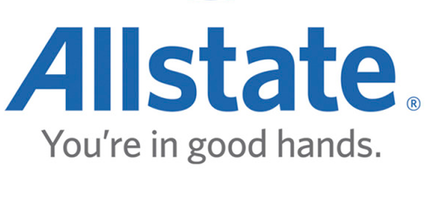

In [2]:
import os
import time
import numpy as np
import pandas as pd
import seaborn as sns
from __future__ import print_function
from __future__ import division
from scipy.stats import skew, boxcox
from scipy import stats
import statsmodels.api as sm
from pandas import DataFrame
from scipy.stats.stats import pearsonr
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import scipy.stats as stats
from mpl_toolkits.axes_grid.anchored_artists import AnchoredDrawingArea
import utils
#import skutils
import clone
from IPython.display import Image
from ggplot import *
#matplotlib.style.use('ggplot')

from sklearn.cross_validation import train_test_split
from sklearn.cross_validation import KFold 
from sklearn.cross_validation import cross_val_score
from sklearn.cross_validation import ShuffleSplit
from sklearn.cross_validation import StratifiedKFold, KFold
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import make_scorer
from sklearn.grid_search import GridSearchCV
from sklearn.grid_search import RandomizedSearchCV
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn import decomposition
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
#from sompy.visualization.mapview import View2D
#from sompy.visualization.umatrix import UMatrixView
#from sompy.visualization.histogram import Hist2d
from sklearn.cluster import DBSCAN
from sklearn.cluster import KMeans
from sklearn.tree import _tree
#from feature import DropInvariant, CombineLevels, SelectFeature, CreateFeature

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
#from deep_forest import MGCForest
#import xgboost as xgb
#from xgboost.sklearn import XGBRegressor

import tensorflow as tf
tf.python.control_flow_ops = tf
from keras.models import Sequential
from keras.models import save_model, load_model
from keras.layers.advanced_activations import PReLU
from keras.layers import Dense
from keras.layers import Dropout
from keras.layers import Activation
from keras.layers import BatchNormalization
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint
from keras.optimizers import SGD

import io
import requests
url="https://raw.githubusercontent.com/rpwr021/Kaggle_allstate/master/train.csv"
s=requests.get(url).content
DATA=pd.read_csv(io.StringIO(s.decode('utf-8')))
urll="https://raw.githubusercontent.com/rpwr021/Kaggle_allstate/master/test.csv"
ss=requests.get(urll).content
DATADATA=pd.read_csv(io.StringIO(ss.decode('utf-8')))
#DATA = pd.read_csv("C:/Users/jeblanch/Documents/AllState Claim Severity.csv")

pd.set_option('display.max_columns', None)
import warnings
warnings.filterwarnings('ignore')

import sys
print('Python: {}'.format(sys.version))
import scipy
print('scipy: {}'.format(scipy.__version__))
import numpy
print('numpy: {}'.format(numpy.__version__))
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))
import pandas
print('pandas: {}'.format(pandas.__version__))
import sklearn
print('sklearn: {}'.format(sklearn.__version__))
import keras
print('keras: {}'.format(keras.__version__))
import tensorflow
print('tensorflow: {}'.format(tensorflow.__version__))

Image(filename='C:/Users/jeblanch/Documents/picture1.png', width=200)

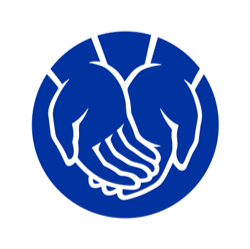

In [19]:
Image(filename='C:/Users/jeblanch/Documents/picture2.png', width=200)

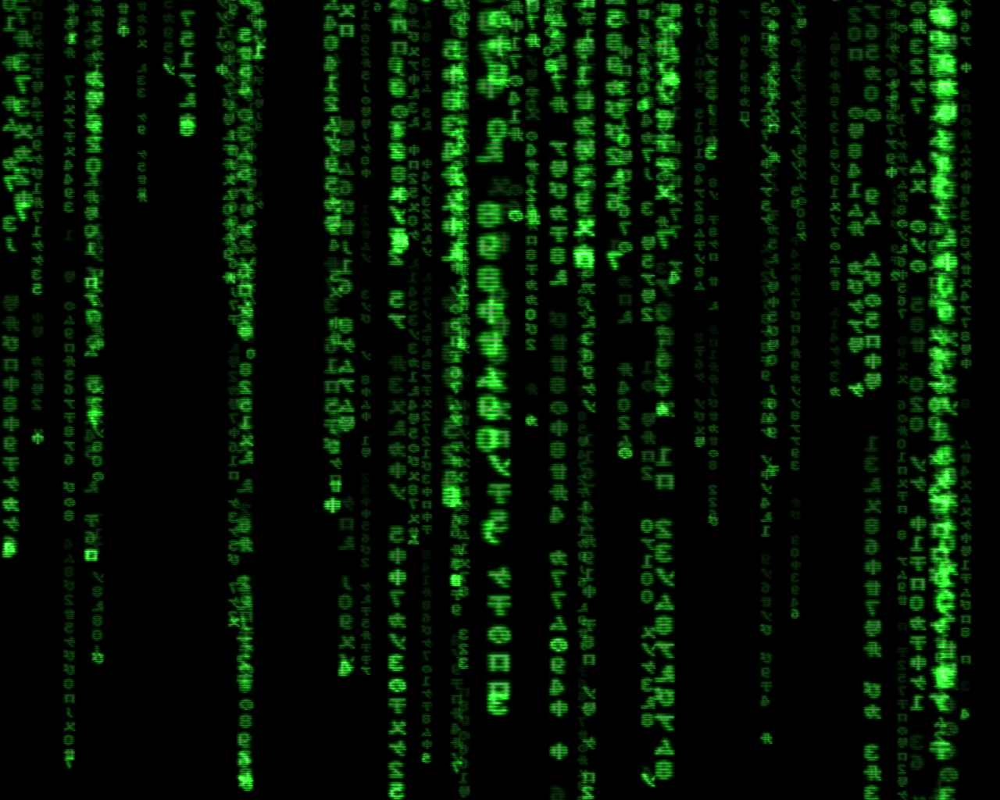

In [35]:
Image(filename='C:/Users/jeblanch/Documents/picture4.PNG', width=300)

# Part 2) Data Description and Interaction

In [3]:
DATA.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188318 entries, 0 to 188317
Columns: 132 entries, id to loss
dtypes: float64(15), int64(1), object(116)
memory usage: 189.7+ MB


In [18]:
(DATA.dtypes==object).sum()

116

In [22]:
(DATA.dtypes==float).sum()

15

In [14]:
DATA.isnull().values.any()

False

In [4]:
DATA.shape

(188318, 132)

In [5]:
skewed = DATA.loc[:,"cont1":"loss"].apply(lambda x: skew(x))
skewed

cont1     0.516420
cont2    -0.310939
cont3    -0.010002
cont4     0.416093
cont5     0.681617
cont6     0.461211
cont7     0.826046
cont8     0.676629
cont9     1.072420
cont10    0.354998
cont11    0.280819
cont12    0.291990
cont13    0.380739
cont14    0.248672
loss      3.794928
dtype: float64

In [31]:
DATA.columns.values

array(['id', 'cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7',
       'cat8', 'cat9', 'cat10', 'cat11', 'cat12', 'cat13', 'cat14',
       'cat15', 'cat16', 'cat17', 'cat18', 'cat19', 'cat20', 'cat21',
       'cat22', 'cat23', 'cat24', 'cat25', 'cat26', 'cat27', 'cat28',
       'cat29', 'cat30', 'cat31', 'cat32', 'cat33', 'cat34', 'cat35',
       'cat36', 'cat37', 'cat38', 'cat39', 'cat40', 'cat41', 'cat42',
       'cat43', 'cat44', 'cat45', 'cat46', 'cat47', 'cat48', 'cat49',
       'cat50', 'cat51', 'cat52', 'cat53', 'cat54', 'cat55', 'cat56',
       'cat57', 'cat58', 'cat59', 'cat60', 'cat61', 'cat62', 'cat63',
       'cat64', 'cat65', 'cat66', 'cat67', 'cat68', 'cat69', 'cat70',
       'cat71', 'cat72', 'cat73', 'cat74', 'cat75', 'cat76', 'cat77',
       'cat78', 'cat79', 'cat80', 'cat81', 'cat82', 'cat83', 'cat84',
       'cat85', 'cat86', 'cat87', 'cat88', 'cat89', 'cat90', 'cat91',
       'cat92', 'cat93', 'cat94', 'cat95', 'cat96', 'cat97', 'cat98',
       'cat99', 'cat100

In [43]:
colomn_uniques=[]
for col in DATA.iloc[:,1:117]:
    colomn_uniques.append([col,len(DATA[col].unique())])
print(colomn_uniques)

[['cat1', 2], ['cat2', 2], ['cat3', 2], ['cat4', 2], ['cat5', 2], ['cat6', 2], ['cat7', 2], ['cat8', 2], ['cat9', 2], ['cat10', 2], ['cat11', 2], ['cat12', 2], ['cat13', 2], ['cat14', 2], ['cat15', 2], ['cat16', 2], ['cat17', 2], ['cat18', 2], ['cat19', 2], ['cat20', 2], ['cat21', 2], ['cat22', 2], ['cat23', 2], ['cat24', 2], ['cat25', 2], ['cat26', 2], ['cat27', 2], ['cat28', 2], ['cat29', 2], ['cat30', 2], ['cat31', 2], ['cat32', 2], ['cat33', 2], ['cat34', 2], ['cat35', 2], ['cat36', 2], ['cat37', 2], ['cat38', 2], ['cat39', 2], ['cat40', 2], ['cat41', 2], ['cat42', 2], ['cat43', 2], ['cat44', 2], ['cat45', 2], ['cat46', 2], ['cat47', 2], ['cat48', 2], ['cat49', 2], ['cat50', 2], ['cat51', 2], ['cat52', 2], ['cat53', 2], ['cat54', 2], ['cat55', 2], ['cat56', 2], ['cat57', 2], ['cat58', 2], ['cat59', 2], ['cat60', 2], ['cat61', 2], ['cat62', 2], ['cat63', 2], ['cat64', 2], ['cat65', 2], ['cat66', 2], ['cat67', 2], ['cat68', 2], ['cat69', 2], ['cat70', 2], ['cat71', 2], ['cat72', 2], 

In [33]:
VECTOR=[]
for col in DATA.iloc[:,1:117]:
    VECTOR.append(len(DATA[col].unique()))
np.sort(VECTOR)

array([  2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   3,   3,   3,   3,   4,   4,
         4,   4,   4,   4,   4,   4,   4,   4,   4,   4,   5,   5,   5,
         7,   7,   7,   7,   8,   8,   8,   9,  11,  13,  15,  16,  16,
        17,  17,  19,  19,  20,  20,  23,  51,  61,  84, 131, 326])

In [34]:
len(VECTOR)

116

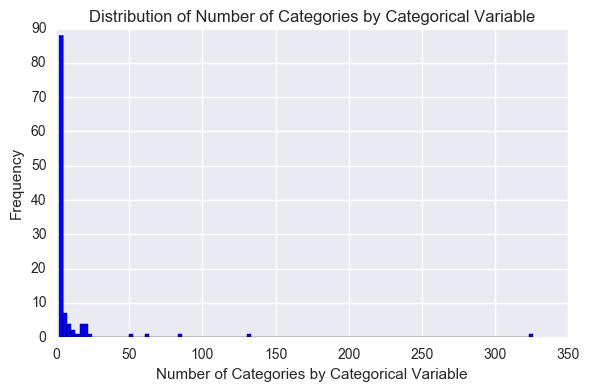

In [38]:
VECTORR = DataFrame(VECTOR)
VECTORR.hist(bins=116, color='b')
plt.xlabel('Number of Categories by Categorical Variable')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Categories by Categorical Variable')
plt.ylim([0,90])
plt.tight_layout()
plt.show()

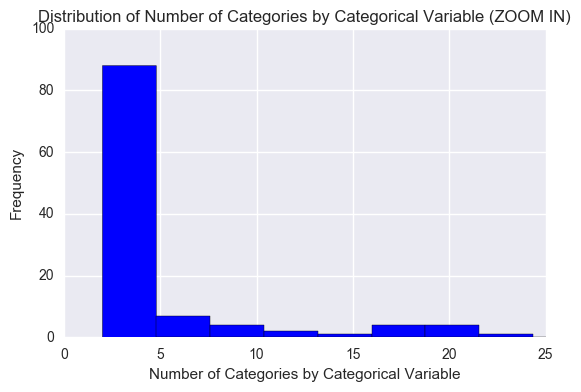

In [36]:
VECTORR = DataFrame(VECTOR)
VECTORR.hist(bins=116, color='b')
plt.xlabel('Number of Categories by Categorical Variable')
plt.ylabel('Frequency')
plt.title('Distribution of Number of Categories by Categorical Variable (ZOOM IN)')
plt.ylim([0,100])
plt.xlim([0,25])
plt.tight_layout()
plt.show()

In [13]:
DATA.head(20)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,A,B,A,B,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,D,B,B,D,D,B,D,C,B,D,B,A,A,A,A,A,D,B,C,E,A,C,T,B,G,A,A,I,E,G,J,G,BU,BC,C,AS,S,A,O,LB,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,A,B,A,A,A,A,A,A,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,A,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,L,F,A,A,E,E,I,K,K,BI,CQ,A,AV,BM,A,O,DP,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,A,B,A,A,B,A,A,A,B,B,B,B,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,B,D,B,D,C,B,B,B,A,A,A,A,A,D,D,C,E,E,A,D,L,O,A,B,E,F,H,F,A,AB,DK,A,C,AF,A,I,GK,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,B,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,D,B,B,D,D,D,B,C,B,D,B,A,A,A,A,A,D,D,C,E,E,D,T,I,D,A,A,E,E,I,K,K,BI,CS,C,N,AE,A,O,DJ,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,A,B,A,B,A,A,A,A,B,B,A,B,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,C,A,A,A,B,H,D,B,D,E,E,A,P,F,J,A,A,D,E,K,G,B,H,C,C,Y,BM,A,K,CK,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85
5,13,A,B,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,D,B,B,C,B,B,B,A,A,A,A,A,D,D,D,E,C,A,P,J,D,A,A,E,E,H,F,B,BI,CS,A,AS,AE,A,K,DJ,0.546670,0.681761,0.634224,0.373816,0.302678,0.364464,0.401162,0.26847,0.46226,0.50556,0.366788,0.359249,0.345247,0.726792,5142.87
6,14,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,D,C,B,B,B,A,A,A,A,A,D,D,D,E,C,A,P,J,A,A,C,E,E,H,F,B,BI,DK,A,J,AF,A,K,DJ,0.471447,0.737068,0.613660,0.189137,0.295397,0.381515,0.363768,0.24564,0.40455,0.47225,0.334828,0.352251,0.342239,0.382931,1132.22
7,20,A,B,A,B,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,B,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,D,B,D,A,B,C,B,D,C,D,A,A,A,A,C,B,C,E,A,C,T,H,C,A,A,K,F,F,I,G,BI,EB,G,AH,Y,A,P,LO,0.826591,0.488789,0.263570,0.623770,0.473767,0.867021,0.583389,0.90267,0.84847,0.80218,0.644013,0.785706,0.859764,0.242416,3585.75
8,23,A,B,B,B,B,A,A,A,B,B,B,B,B,A,A,B,A,A,A,A,A,A,B,A,A,A,A,A,A,A,A,A,A,A,A,B,A,B,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,B,A,A,A,A,D,B,D,B,B,B,B,C,B,D,D,A,A,B,A,A,D,C,C,E,C,D,T,C,Q,A,C,H,F,G,M,K,BI,BC

In [37]:
DATA.describe(include = 'all')

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
count,188318.000000,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000,188318.000000
unique,NaN,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,2,3,3,3,3,4,4,4,4,4,4,4,4,4,4,4,4,8,7,8,7,5,7,5,8,7,5,16,15,19,9,13,17,20,17,20,11,84,131,16,51,61,19,23,326,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,A,D,B,B,D,D,B,B,C,B,B,B,A,A,A,A,A,D,D,C,E,C,A,P,F,A,A,A,E,E,G,F,B,BI,CL,A,E,BM,A,K,HK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,141550,106721,177993,128395,123737,131693,183744,177274,113122,160213,168186,159825,168851,186041,188284,181843,187009,187331,186510,188114,187905,188275,157445,181977,169969,177119,168250,180938,184593,184760,182980,187107,187361,187734,188105,156313,165729,169323,183393,180119,181177,186623,184110,172716,183991,187436,187617,188049,179127,137611,187071,179505,172949,183762,188173,188136,185296,188079,188018,187872,187596,188273,188239,188271,186056,179982,187626,188176,188011,188295,178646,118322,154275,184731,154307,181347,187503,186526,152929,137505,154385,147536,141534,154939,186005,103852,166992,168926,183744,177993,111028,124689,150237,121642,87531,174360,78127,105492,79455,42970,106721,177274,123737,42925,76493,47165,47310,65512,152918,25305,128395,25148,26191,131693,43866,21061,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,294135.982561,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.493861,0.507188,0.498918,0.491812,0.487428,0.490945,0.484970,0.486437,0.485506,0.498066,0.493511,0.493150,0.493138,0.495717,3037.337686
std,169336.084867,NaN,NaN,NaN,NaN,NaN,NaN,

# Continuous Variables

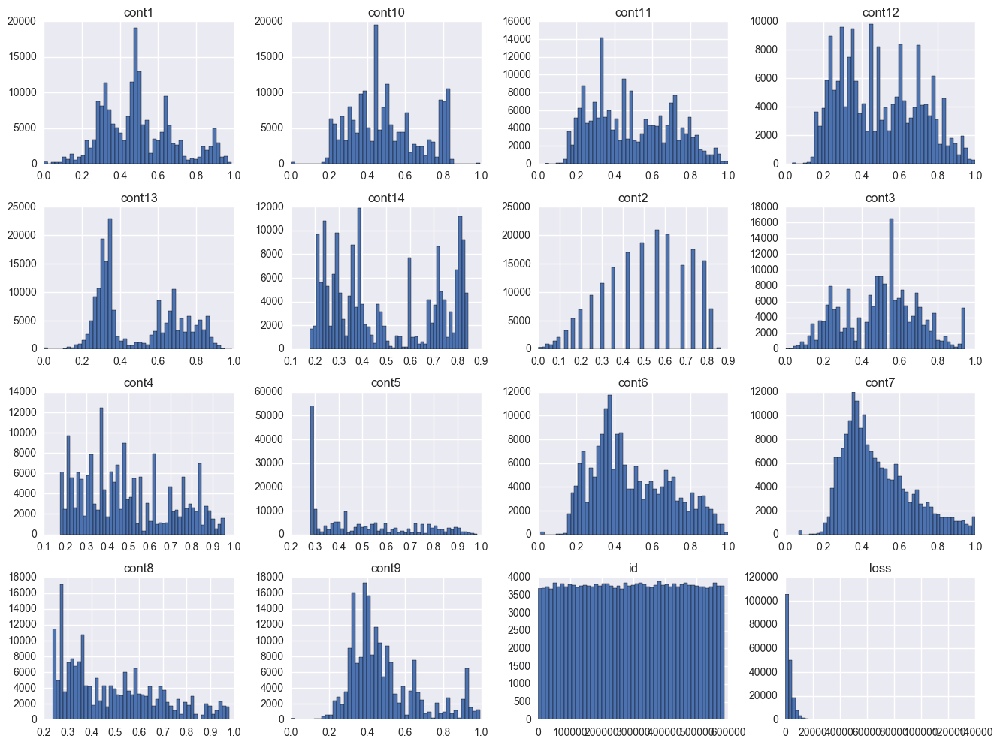

In [44]:
DATA.hist(bins=50, figsize=(16,12));

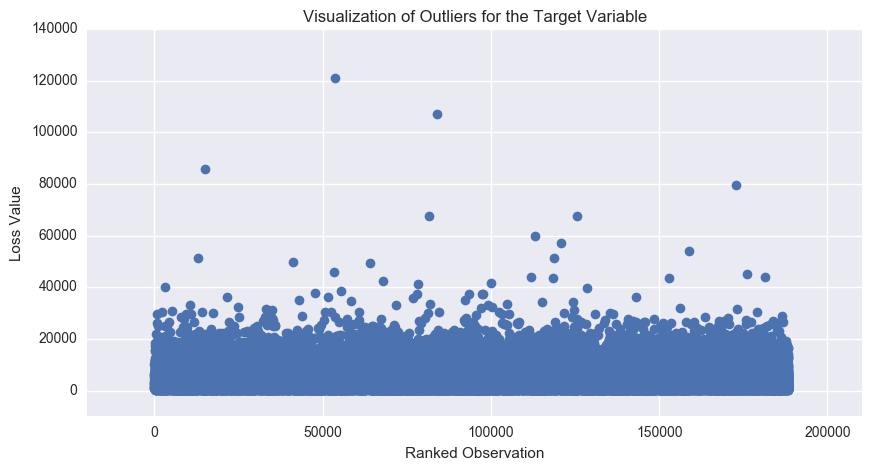

In [47]:
plt.figure(figsize=(10,5))
plt.xlabel('Ranked Observation')
plt.ylabel('Loss Value')
plt.title('Visualization of Outliers for the Target Variable')
plt.xlim([-20000,210318])
plt.ylim([-10000,140000])
plt.plot(DATA.index, DATA["loss"],'o')
plt.show()

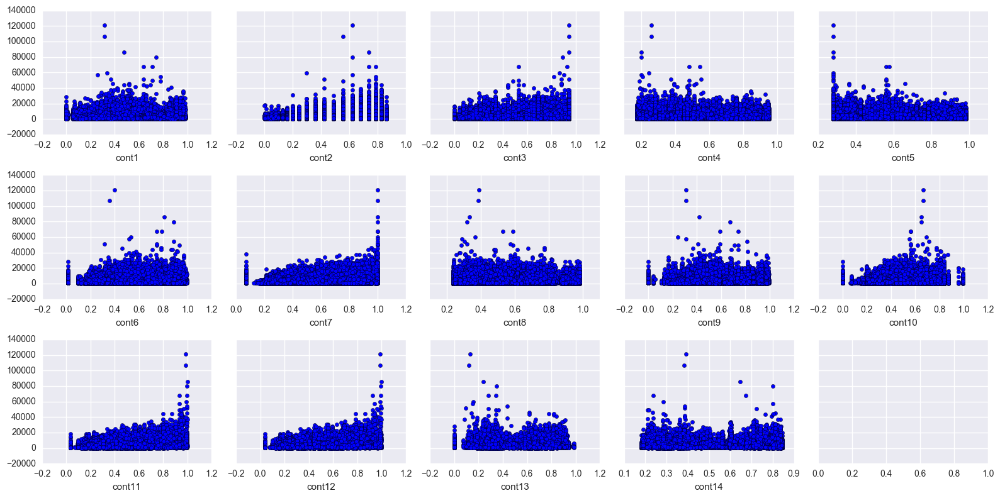

In [54]:
cont_features = [col for col in DATA.columns[1:-1] if 'cont' in col]
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(16, 8), sharey=True)

Ai = 0
Bi = 0

for i in range(0, 14):
    axes[Ai][Bi].scatter(DATA[cont_features[i]], DATA.loss)
    axes[Ai][Bi].set_xlabel(cont_features[i])
    Bi += 1
    if Bi > 4:
        Ai += 1
        Bi = 0
plt.tight_layout();

In [36]:
MC = DATA.iloc[:,117:132].corr()
MC

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
cont1,1.000000,-0.085180,-0.445431,0.367549,-0.025230,0.758315,0.367384,0.361163,0.929912,0.808551,0.596090,0.614225,0.534850,0.056688,-0.010237
cont2,-0.085180,1.000000,0.455861,0.038693,0.191427,0.015864,0.048187,0.137468,-0.032729,0.063526,0.116824,0.106250,0.023335,-0.045584,0.141528
cont3,-0.445431,0.455861,1.000000,-0.341633,0.089417,-0.349278,0.097516,-0.185432,-0.417054,-0.325562,0.025271,0.006111,-0.418203,-0.039592,0.111053
cont4,0.367549,0.038693,-0.341633,1.000000,0.163748,0.220932,-0.115064,0.528740,0.328961,0.283294,0.120927,0.130453,0.179342,0.017445,-0.035831
cont5,-0.025230,0.191427,0.089417,0.163748,1.000000,-0.149810,-0.249344,0.009015,-0.088202,-0.064967,-0.151548,-0.148217,-0.082915,-0.021638,-0.011355
cont6,0.758315,0.015864,-0.349278,0.220932,-0.149810,1.000000,0.658918,0.437437,0.797544,0.883351,0.773745,0.785144,0.815091,0.042178,0.040967
cont7,0.367384,0.048187,0.097516,-0.115064,-0.249344,0.658918,1.000000,0.142042,0.384343,0.492621,0.747108,0.742712,0.288395,0.022286,0.119799
cont8,0.361163,0.137468,-0.185432,0.528740,0.009015,0.437437,0.142042,1.000000,0.452658,0.336588,0.302381,0.315904,0.476402,0.043539,0.030508
cont9,0.929912,-0.032729,-0.417054,0.328961,-0.088202,0.797544,0.384343,0.452658,1.000000,0.785697,0.608000,0.626656,0.642028,0.074154,0.014456
cont10,0.808551,0.063526,-0.325562,0.283294,-0.064967,0.883351,0.492621,0.336588,0.785697,1.000000,0.702896,0.713812,0.707876,0.041808,0.020236


In [28]:
threshold = 0.5
important_corrs = (MC[abs(MC) > threshold][MC != 1.0]) .unstack().dropna().to_dict()
unique_important_corrs = pd.DataFrame(list(set([(tuple(sorted(key)), important_corrs[key]) 
for key in important_corrs])), columns=['feature pair', 'correlation coefficient'])
unique_important_corrs = unique_important_corrs.ix[abs(unique_important_corrs['correlation coefficient']).argsort()[::-1]]
unique_important_corrs

,feature pair,correlation coefficient
12,"(cont11, cont12)",0.994384
1,"(cont1, cont9)",0.929912
22,"(cont10, cont6)",0.883351
6,"(cont13, cont6)",0.815091
4,"(cont1, cont10)",0.808551
16,"(cont6, cont9)",0.797544
8,"(cont10, cont9)",0.785697
2,"(cont12, cont6)",0.785144
7,"(cont11, cont6)",0.773745
13,"(cont1, cont6)",0.758315


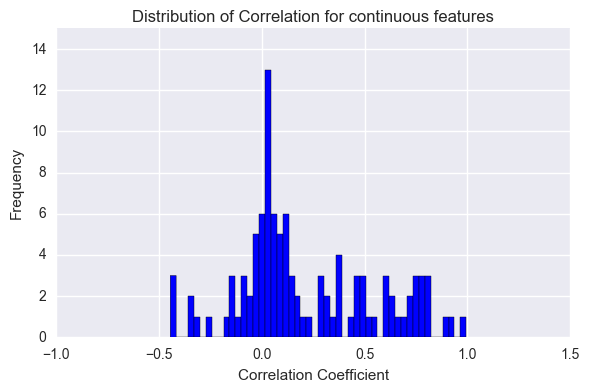

In [29]:
threshold = 0.000
important_corrs = (MC[abs(MC) > threshold][MC != 1.0]) .unstack().dropna().to_dict()
unique_important_corrs = pd.DataFrame(list(set([(tuple(sorted(key)), important_corrs[key]) 
for key in important_corrs])), columns=['feature pair', 'correlation coefficient'])
unique_important_corrs1 = unique_important_corrs.ix[abs(unique_important_corrs['correlation coefficient']).argsort()[::-1]]

unique_important_corrs1.hist(bins=50, color='b')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Frequency')
plt.ylim([0,15])
plt.xlim([-1,1.5])
plt.title('Distribution of Correlation for continuous features')
plt.tight_layout()
#plt.grid(color='black', linestyle='dotted')
plt.show();

In [54]:
ggg = np.sort(MC.loss).reshape(15,1)
ggg

array([[-0.03583081],
       [-0.0113545 ],
       [-0.01023694],
       [-0.00402211],
       [ 0.01445559],
       [ 0.01929783],
       [ 0.02023614],
       [ 0.03050838],
       [ 0.04096682],
       [ 0.09872385],
       [ 0.09980638],
       [ 0.11105331],
       [ 0.11979887],
       [ 0.14152796],
       [ 1.        ]])

In [55]:
len(ggg)

15

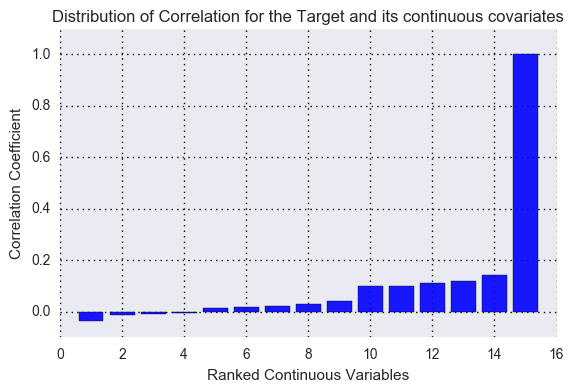

In [66]:
plt.bar(range(1, 16), ggg, alpha=0.9, align='center', color='blue')
#ggg.hist(bins=15, color='b')
plt.xlabel('Ranked Continuous Variables')
plt.ylabel('Correlation Coefficient')
plt.ylim([-0.1,1.1])
#plt.xlim([-1,1])
plt.title('Distribution of Correlation for the Target and its continuous covariates')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
plt.show();

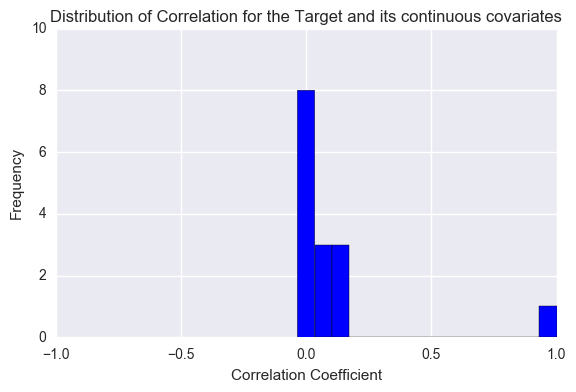

In [30]:
MC.loss.hist(bins=15, color='b')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Frequency')
plt.ylim([0,10])
plt.xlim([-1,1])
plt.title('Distribution of Correlation for the Target and its continuous covariates')
plt.tight_layout()
#plt.grid(color='black', linestyle='dotted')
plt.show();

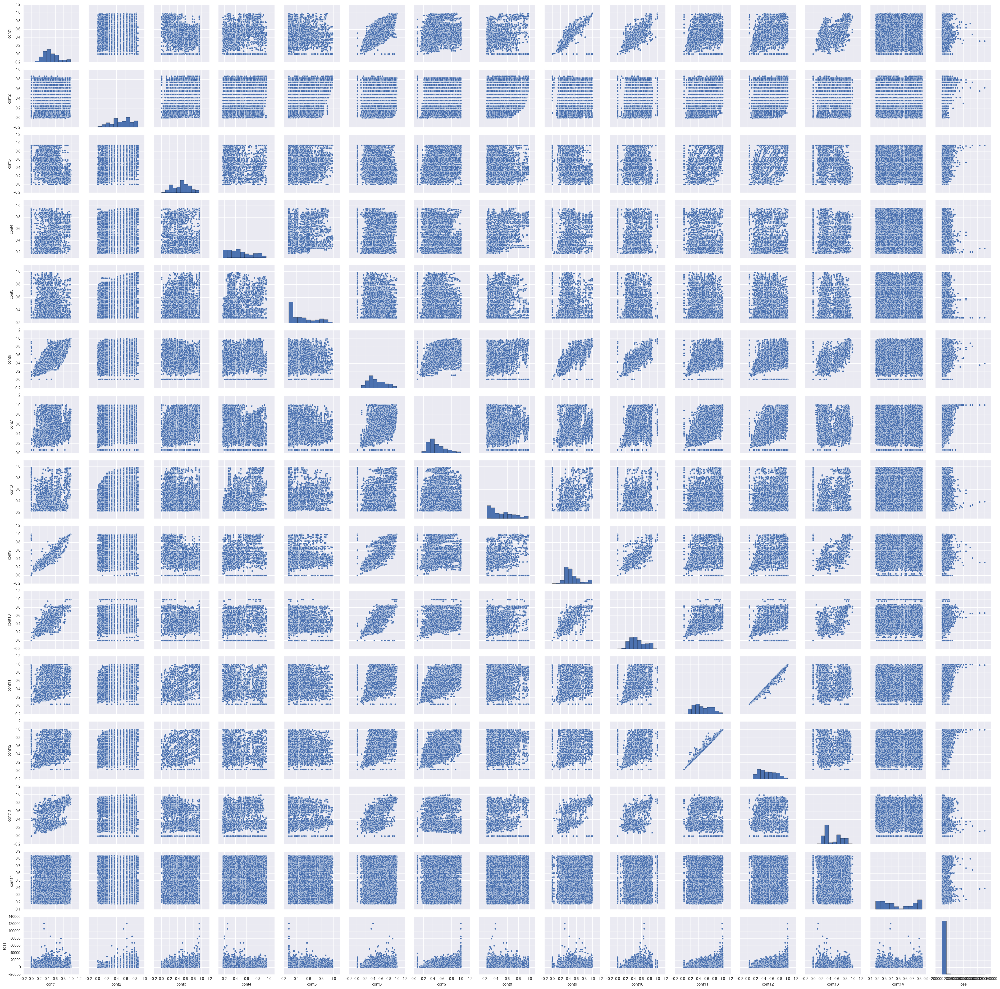

In [60]:
sns.pairplot(DATA, vars=["cont1", "cont2", "cont3", "cont4", "cont5", "cont6", "cont7", "cont8", "cont9", "cont10",
"cont11", "cont12", "cont13", "cont14", "loss"])
plt.show()

### Two cluster of continuous variable are identified

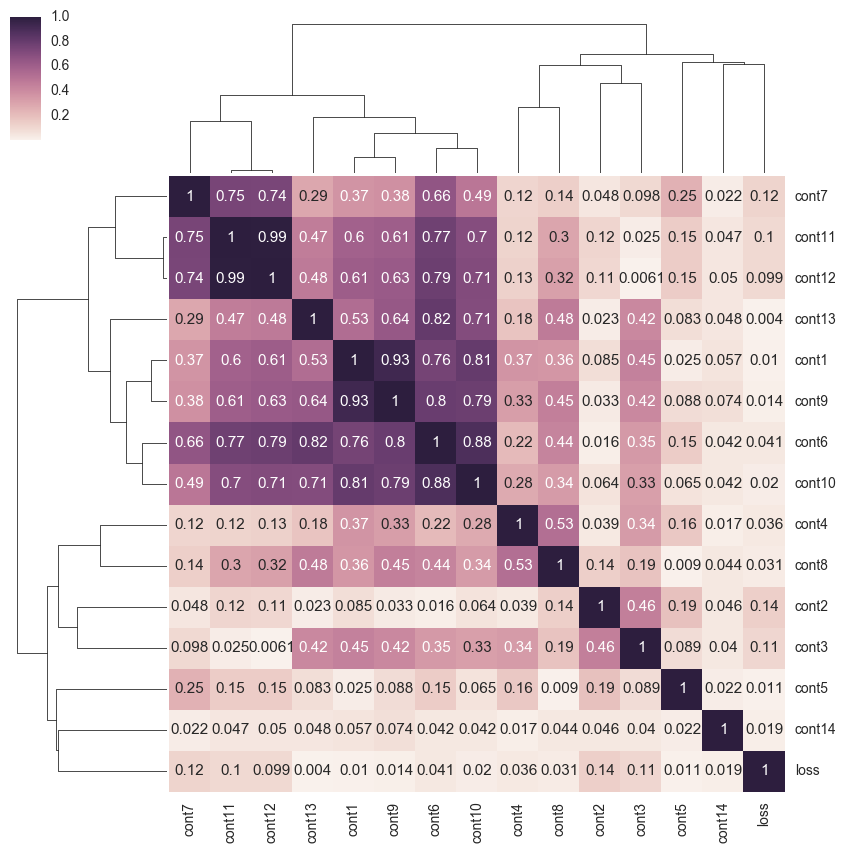

In [52]:
DATA_CONTINUOUS = DATA.iloc[:,117:132]
DATA_CONTINUOUS = DATA_CONTINUOUS.corr().abs()
map = sns.clustermap(DATA_CONTINUOUS, annot = True, annot_kws = {'size': 11})
sns.plt.setp(map.ax_heatmap.yaxis.get_majorticklabels(),rotation = 0)
sns.plt.show()

# Binary Categorical Variables

## Variance

In [2]:
MAXI = []
for col in DATA:
    if DATA[col].dtype == "object" and len(DATA[col].unique()) == 2:
        value_counting = DATA[col].value_counts(normalize=True)
        MAXI.append(value_counting.max())
MAXII = np.sort(MAXI)
MAXII

array([ 0.56670632,  0.60069669,  0.62830956,  0.65706411,  0.68179887,
        0.6993118 ,  0.73073737,  0.75165412,  0.83004811,  0.83605922,
        0.84869742,  0.85075776,  0.88004864,  0.89309572,  0.89343557,
        0.89662698,  0.89913338,  0.90256375,  0.91715078,  0.91838805,
        0.94053144,  0.94135452,  0.94517253,  0.94864007,  0.95119426,
        0.9532015 ,  0.95573445,  0.95646194,  0.96081097,  0.9620801 ,
        0.96561667,  0.96632823,  0.97165433,  0.97384743,  0.9757113 ,
        0.97580688,  0.97702291,  0.97765482,  0.98021963,  0.98110643,
        0.98395268,  0.98790875,  0.9879884 ,  0.99039922,  0.99099927,
        0.99304899,  0.99337822,  0.99356939,  0.99475887,  0.99491817,
        0.99531643,  0.99616606,  0.99627757,  0.99632536,  0.99689886,
        0.99763167,  0.9978069 ,  0.99836978,  0.99840695,  0.99857157,
        0.99873087,  0.99886893,  0.99891673,  0.99903355,  0.99923003,
        0.99924596,  0.9995805 ,  0.99975042,  0.99976104,  0.99

In [6]:
len(MAXI)

72

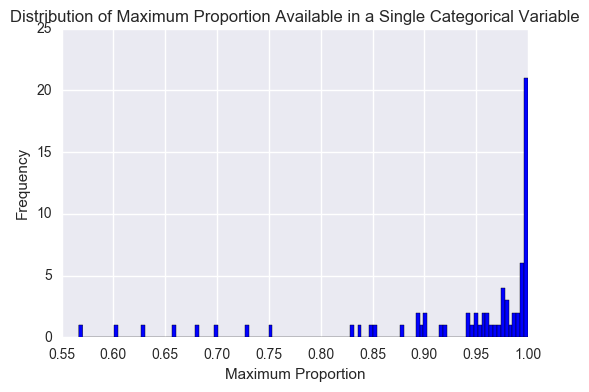

In [56]:
MAXII = DataFrame(MAXI)
MAXII.hist(bins=116, color='b')
plt.xlabel('Maximum Proportion')
plt.ylabel('Frequency')
plt.title('Distribution of Maximum Proportion Available in a Single Categorical Variable')
plt.tight_layout()
#plt.grid(color='black', linestyle='dotted')
plt.show()

In [8]:
MAXII.describe(include = 'all')

,0
count,72.000000
mean,0.930802
std,0.106002
min,0.566706
25%,0.913504
50%,0.976415
75%,0.996469
max,0.999878


## Predictive Potential

In [4]:
VARIANCE = []
dif = []
for col in DATA:
    if DATA[col].dtype == "object" and len(DATA[col].unique()) == 2:
        grouped = DATA['loss'].groupby(DATA[col]).mean()
        dif = np.absolute(grouped['A']-grouped['B'])
        VARIANCE.append(dif)
VARIANCEE = np.sort(VARIANCE)
VARIANCEE

array([   84.00403236,    87.1333461 ,    98.3566689 ,   161.89398671,
         219.66219803,   294.44206558,   347.51984609,   389.12050953,
         399.29427736,   438.68116334,   505.42576009,   517.72273709,
         595.88053718,   604.32483243,   649.36147112,   661.56539384,
         722.13068415,   740.23095079,   814.78062791,   838.35871428,
         841.92390654,   878.26005299,   890.20917763,   893.89819828,
         922.60835399,   938.67083749,  1037.64645865,  1044.78417076,
        1053.43368112,  1159.15334774,  1209.74389267,  1210.29034163,
        1212.34182674,  1233.78397837,  1241.88005093,  1257.13905198,
        1315.61284757,  1316.96729941,  1345.96432694,  1371.50749104,
        1424.67381951,  1462.36156588,  1471.33824653,  1482.30907089,
        1492.89299395,  1524.04937923,  1648.86189456,  1681.86244477,
        1686.36256094,  1696.5163885 ,  1710.40976223,  1741.68032171,
        1781.46944469,  1821.59467607,  1840.88504783,  1941.43796626,
      

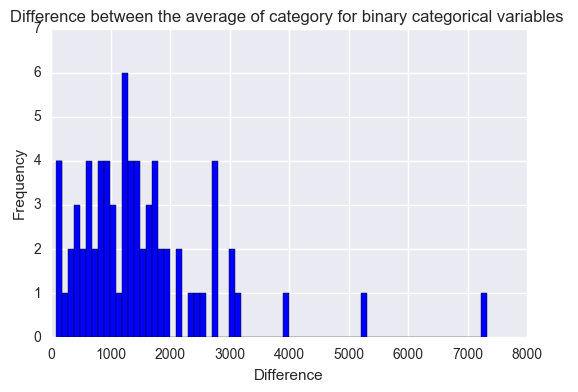

In [55]:
VARIANCEE = DataFrame(VARIANCE)
VARIANCEE.hist(bins=72, color='b')
plt.xlabel('Difference')
plt.ylabel('Frequency')
plt.title('Difference between the average of category for binary categorical variables ')
plt.ylim([0,7])
#plt.xlim([0,25])
plt.tight_layout()
#plt.grid(color='black', linestyle='dotted')
plt.show()

In [38]:
VARIANCEE.describe(include = 'all')

,0
count,72.000000
mean,1502.627090
std,1177.779847
min,84.004032
25%,796.143209
50%,1286.375950
75%,1826.417269
max,7320.098074


In [36]:
len(MAXII) - len(VARIANCEE)

0

## Adding both information on the same graph

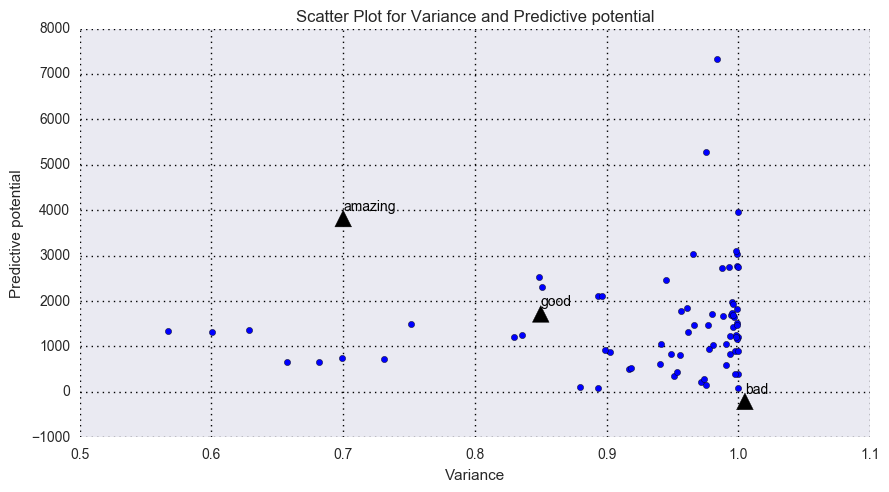

In [40]:
plt.figure(figsize=(9,5), facecolor='white')
plt.scatter(MAXII, VARIANCEE)
plt.xlabel('Variance')
plt.ylabel('Predictive potential')
plt.title('Scatter Plot for Variance and Predictive potential')

plt.annotate('amazing', xy=(0.7, 4000), xytext=(0.7, 4000), 
arrowprops=dict(facecolor='black'), color='black')

plt.annotate('good', xy=(0.85, 1900), xytext=(0.85, 1900), 
arrowprops=dict(facecolor='black'), color='black')

plt.annotate('bad', xy=(1.005, -25), xytext=(1.005, -25), 
arrowprops=dict(facecolor='black'), color='black')

#plt.xlim([0,1])
#plt.ylim([0,1])
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
plt.show();

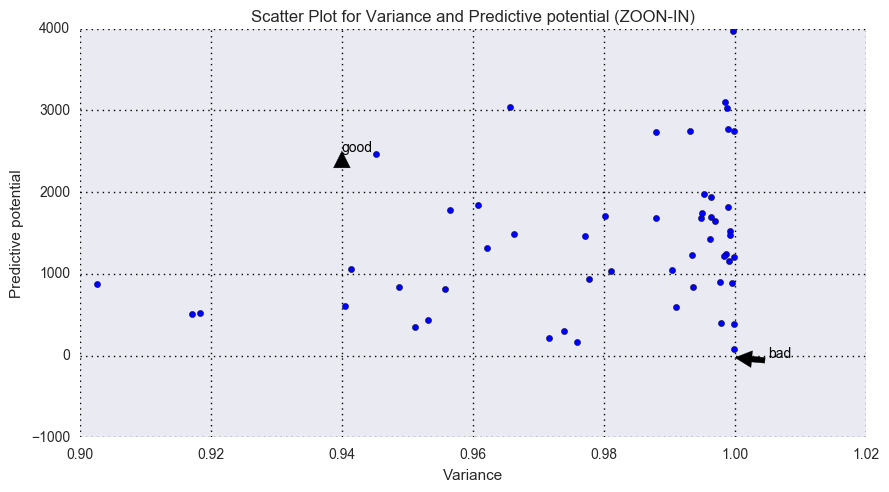

In [41]:
plt.figure(figsize=(9,5), facecolor='white')
plt.scatter(MAXII, VARIANCEE)
plt.xlabel('Variance')
plt.ylabel('Predictive potential')
plt.title('Scatter Plot for Variance and Predictive potential (ZOON-IN)')

plt.annotate('good', xy=(0.94, 2500), xytext=(0.94, 2500), 
arrowprops=dict(facecolor='black'), color='black')

plt.annotate('bad', xy=(1.000, -25), xytext=(1.005, -25), 
arrowprops=dict(facecolor='black'), color='black')

plt.xlim([0.9,1.02])
plt.ylim([-1000,4000])
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
plt.show();

# Categorical Variable with more than 2 Categories

In [2]:
other_cat_features = [col for col in DATA.columns[1:-1] if 'cat' in col and len(DATA[col].unique()) > 2]
len(other_cat_features)

44

In [14]:
MAXIII = []
for col in DATA:
    if DATA[col].dtype == "object" and len(DATA[col].unique()) > 2:
        value_counting = DATA[col].value_counts(normalize=True)
        MAXIII.append(value_counting.max())
MAXIIII = np.sort(MAXIII)
MAXIIII

array([ 0.11183742,  0.13354008,  0.13437377,  0.13907858,  0.22793891,
        0.22817787,  0.23293578,  0.25045402,  0.25122399,  0.34787965,
        0.40619059,  0.41486741,  0.42191931,  0.46480421,  0.55147145,
        0.56018012,  0.56670632,  0.5895772 ,  0.64593932,  0.65706411,
        0.66211939,  0.68179887,  0.6993118 ,  0.73017449,  0.75156915,
        0.78344078,  0.79778354,  0.81202009,  0.81207851,  0.81922599,
        0.81939592,  0.81981011,  0.82275194,  0.88675538,  0.89702524,
        0.92588069,  0.94135452,  0.94517253,  0.96298283,  0.9757113 ,
        0.98095243,  0.98771758,  0.99048418,  0.99567221])

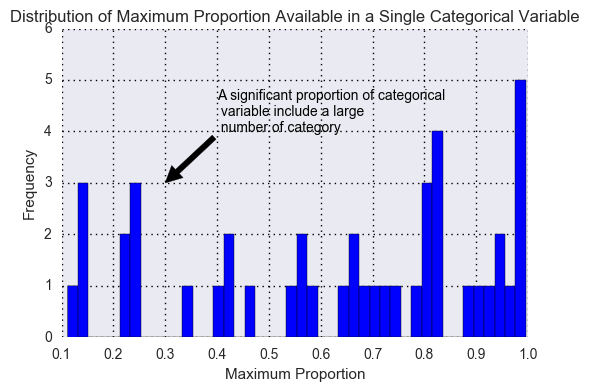

In [25]:
MAXIIII = DataFrame(MAXIIII)
MAXIIII.hist(bins=44, color='b')
plt.xlabel('Maximum Proportion')
plt.ylabel('Frequency')
plt.title('Distribution of Maximum Proportion Available in a Single Categorical Variable')

plt.annotate('A significant proportion of categorical \n variable include a large \n number of category', 
xy=(0.3, 3), xytext=(0.4, 4), arrowprops=dict(facecolor='black'), color='black')

plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
plt.ylim([0,6])
plt.show()

In [17]:
MAXIIII.describe(include = 'all')

,0
count,44.000000
mean,0.632667
std,0.285145
min,0.111837
25%,0.412698
50%,0.690555
75%,0.838753
max,0.995672


# 3) Preprocessing the Data

### A Geometric representation of the Logarithmic Transformation

The logarithmic transformation is like a compressor on your data. It make it easier to deal with. Skewed distribution will become more normally distributed. 

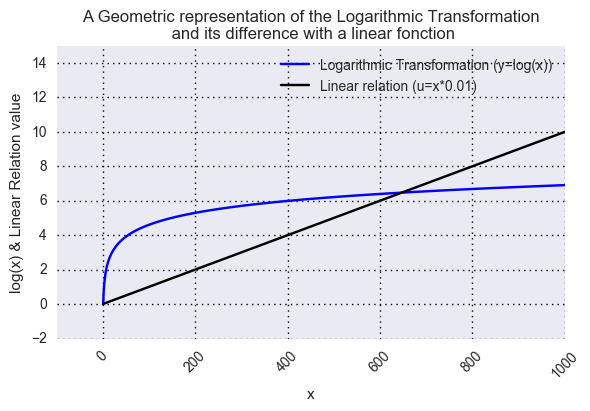

In [94]:
x = range(1, 2000)
y = np.log(x)
u = np.divide(x,100)

plt.figure(figsize = (6, 4))
plt.title('A Geometric representation of the Logarithmic Transformation\n and its difference with a linear fonction')
plt.xlabel('x')
plt.ylabel('log(x) & Linear Relation value')
plt.plot(x,y, label='Logarithmic Transformation (y=log(x))', color='blue')
plt.plot(x,u, label='Linear relation (u=x*0.01)', color='black')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
xt = plt.xticks(rotation=45)
plt.xlim([-100,1000])
plt.ylim([-2,15])
plt.legend()
plt.show();

### Dependente Variable Transformation (loss, log(loss) & log(loss+200))

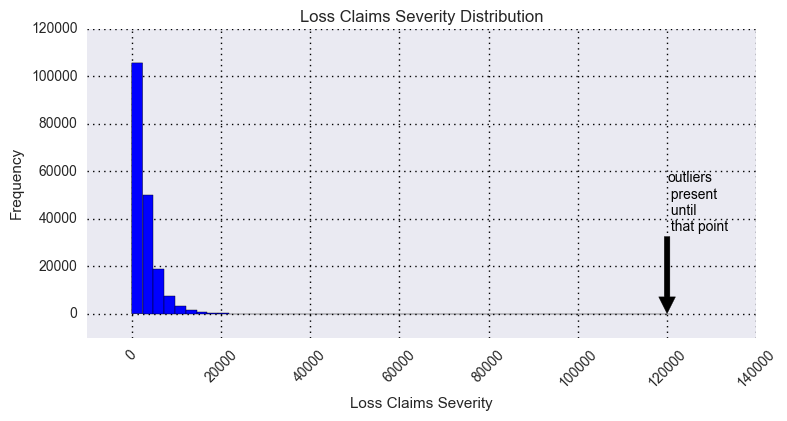

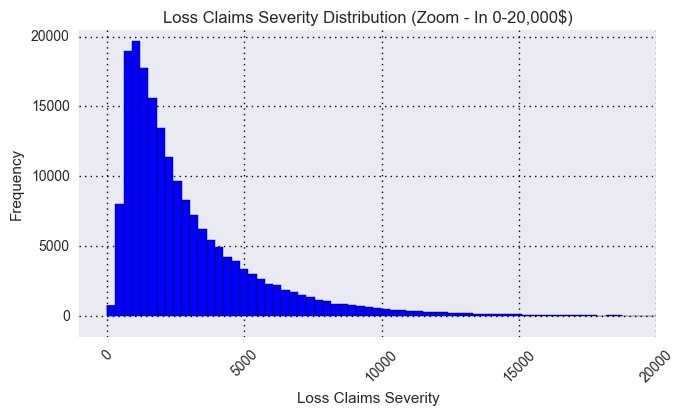

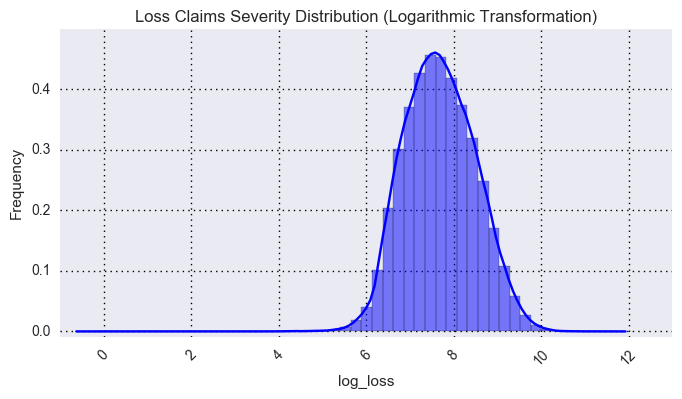

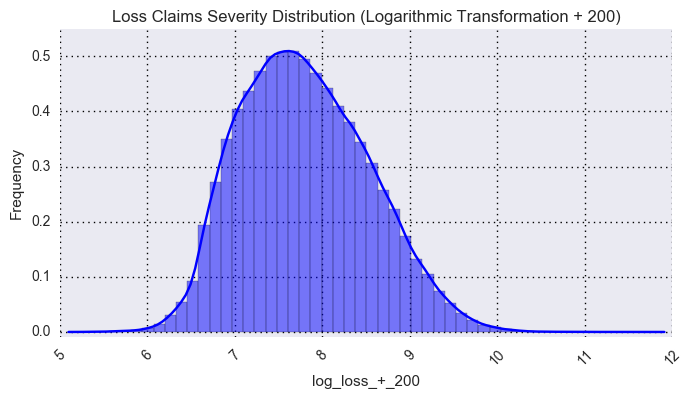

In [3]:
plt.figure(figsize = (8, 4))
plt.title('Loss Claims Severity Distribution')
plt.xlabel('Loss Claims Severity')
plt.ylabel('Frequency')
DATA['loss'].hist(bins=50, color='b')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
xt = plt.xticks(rotation=45)
plt.xlim([-10000,140000])
plt.ylim([-10000,120000])
plt.annotate('outliers\n present\n until\n that point', 
xy=(120000, 100), xytext=(120000, 35000), arrowprops=dict(facecolor='black'), color='black')
plt.show();

plt.figure(figsize = (7, 4))
plt.title('Loss Claims Severity Distribution (Zoom - In 0-20,000$)')
plt.xlabel('Loss Claims Severity')
plt.ylabel('Frequency')
DATA['loss'].hist(bins=400, color='b')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
xt = plt.xticks(rotation=45)
plt.xlim([-1000,20000])
plt.ylim([-1500,20500])
plt.show();

DATA['log_loss'] = np.log(DATA['loss'])

plt.figure(figsize = (7, 4))
plt.title('Loss Claims Severity Distribution (Logarithmic Transformation)')
plt.xlabel('Log Loss Claims Severity')
plt.ylabel('Frequency')
sns.distplot(DATA['log_loss'], kde = True, color = 'blue', hist_kws={'alpha': 0.50})
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
xt = plt.xticks(rotation=45)
plt.xlim([-1,13])
plt.ylim([-0.01,0.5])
plt.show();

DATA['log_loss_+_200'] = np.log(200 + DATA['loss'])

plt.figure(figsize = (7, 4))
plt.title('Loss Claims Severity Distribution (Logarithmic Transformation + 200)')
plt.xlabel('Log Loss Claims Severity')
plt.ylabel('Frequency')
sns.distplot(DATA['log_loss_+_200'], kde = True, color = 'blue', hist_kws={'alpha': 0.50})
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')
xt = plt.xticks(rotation=45)
#plt.xlim([-1,13])
plt.ylim([-0.01,0.55])
plt.show();

### Normality Test for the Dependant Variable

What is the normality test about?

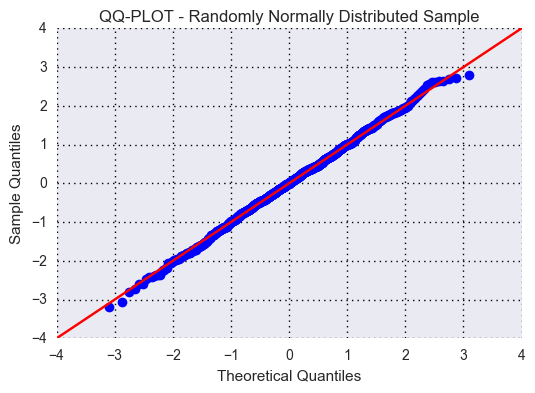

In [51]:
SAMPLE = np.random.normal(0,1, 1000)
sm.qqplot(SAMPLE, line='45')
plt.grid(color='black', linestyle='dotted')
plt.title('QQ-PLOT - Randomly Normally Distributed Sample')
pylab.show()

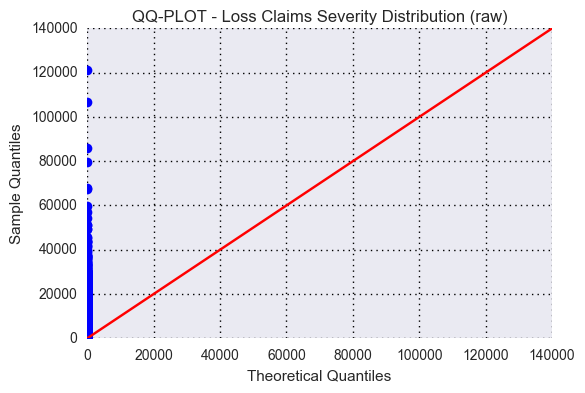

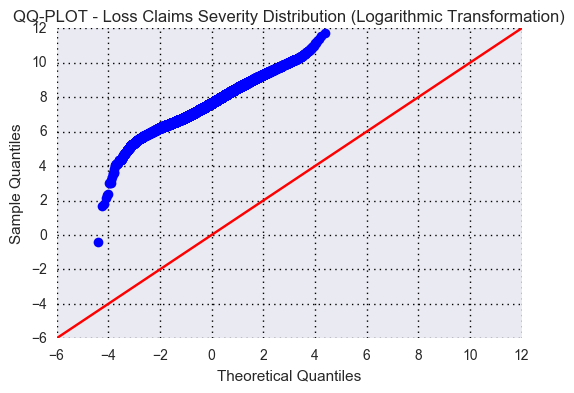

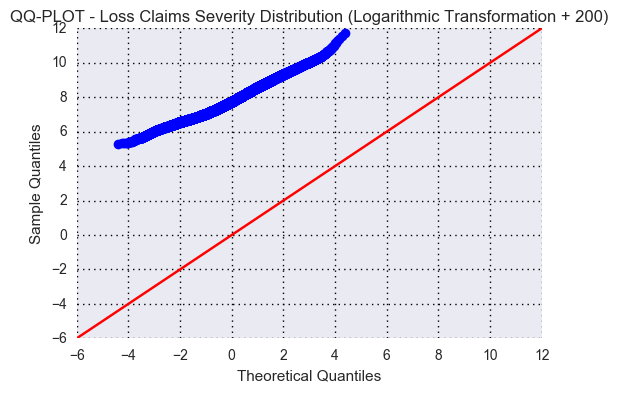

In [52]:
sm.qqplot(DATA['loss'], line='45')
plt.grid(color='black', linestyle='dotted')
plt.title('QQ-PLOT - Loss Claims Severity Distribution (raw)')
pylab.show()

sm.qqplot(DATA['log_loss'], line='45')
plt.grid(color='black', linestyle='dotted')
plt.title('QQ-PLOT - Loss Claims Severity Distribution (Logarithmic Transformation)')
pylab.show()

sm.qqplot(DATA['log_loss_+_200'], line='45')
plt.grid(color='black', linestyle='dotted')
plt.title('QQ-PLOT - Loss Claims Severity Distribution (Logarithmic Transformation + 200)')
pylab.show()

Defining the four sets of covariates according to the data type format

In [3]:
all_categorical_covariates = [x for x in DATA.select_dtypes(include=['object']).columns if x not in ['id','loss', 'log_loss', 'log_loss_+_200']]
continuous_covariates = [x for x in DATA.select_dtypes(exclude=['object']).columns if x not in ['id','loss', 'log_loss', 'log_loss_+_200']]        
binary_categorical_covariates = [x for x in DATA.columns if len(DATA[x].unique()) == 2 and DATA[x].dtype == 'object']
non_bynary_categorical_covariates = [x for x in DATA.columns if len(DATA[x].unique()) > 2 and DATA[x].dtype == 'object']

print("List of Binary Categorical Covariates:\n")
print(binary_categorical_covariates)
print("\n")
print("List of Non Binary Categorical Covariates:\n")
print(non_bynary_categorical_covariates)
print("\n")
print("List of All Categorical Covariates:\n")
print(all_categorical_covariates)
print("\n")
print("List of Continuous Covariates:\n")
print(continuous_covariates)

List of Binary Categorical Covariates:

['cat1', 'cat2', 'cat3', 'cat4', 'cat5', 'cat6', 'cat7', 'cat8', 'cat9', 'cat10', 'cat11', 'cat12', 'cat13', 'cat14', 'cat15', 'cat16', 'cat17', 'cat18', 'cat19', 'cat20', 'cat21', 'cat22', 'cat23', 'cat24', 'cat25', 'cat26', 'cat27', 'cat28', 'cat29', 'cat30', 'cat31', 'cat32', 'cat33', 'cat34', 'cat35', 'cat36', 'cat37', 'cat38', 'cat39', 'cat40', 'cat41', 'cat42', 'cat43', 'cat44', 'cat45', 'cat46', 'cat47', 'cat48', 'cat49', 'cat50', 'cat51', 'cat52', 'cat53', 'cat54', 'cat55', 'cat56', 'cat57', 'cat58', 'cat59', 'cat60', 'cat61', 'cat62', 'cat63', 'cat64', 'cat65', 'cat66', 'cat67', 'cat68', 'cat69', 'cat70', 'cat71', 'cat72']


List of Non Binary Categorical Covariates:

['cat73', 'cat74', 'cat75', 'cat76', 'cat77', 'cat78', 'cat79', 'cat80', 'cat81', 'cat82', 'cat83', 'cat84', 'cat85', 'cat86', 'cat87', 'cat88', 'cat89', 'cat90', 'cat91', 'cat92', 'cat93', 'cat94', 'cat95', 'cat96', 'cat97', 'cat98', 'cat99', 'cat100', 'cat101', 'cat102', 

In [4]:
DATA_BINCAT = DATA[binary_categorical_covariates]
DATA_NONBINCAT = DATA[non_bynary_categorical_covariates]
DATA_ALLCAT = DATA[all_categorical_covariates]
DATA_CONTCAT = DATA[continuous_covariates]

### Numerical encoding for categorical variables

In [5]:
for x in all_categorical_covariates:
    lb = LabelEncoder()
    lb.fit(DATA[x].unique())
    DATA[x] = lb.transform(DATA[x])

In [4]:
DATA.head(20)

,id,cat1,cat2,cat3,cat4,cat5,cat6,cat7,cat8,cat9,cat10,cat11,cat12,cat13,cat14,cat15,cat16,cat17,cat18,cat19,cat20,cat21,cat22,cat23,cat24,cat25,cat26,cat27,cat28,cat29,cat30,cat31,cat32,cat33,cat34,cat35,cat36,cat37,cat38,cat39,cat40,cat41,cat42,cat43,cat44,cat45,cat46,cat47,cat48,cat49,cat50,cat51,cat52,cat53,cat54,cat55,cat56,cat57,cat58,cat59,cat60,cat61,cat62,cat63,cat64,cat65,cat66,cat67,cat68,cat69,cat70,cat71,cat72,cat73,cat74,cat75,cat76,cat77,cat78,cat79,cat80,cat81,cat82,cat83,cat84,cat85,cat86,cat87,cat88,cat89,cat90,cat91,cat92,cat93,cat94,cat95,cat96,cat97,cat98,cat99,cat100,cat101,cat102,cat103,cat104,cat105,cat106,cat107,cat108,cat109,cat110,cat111,cat112,cat113,cat114,cat115,cat116,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,loss
0,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,3,1,1,3,3,1,3,2,1,3,1,0,0,0,0,0,3,1,2,4,0,2,15,1,6,0,0,8,4,6,9,6,45,28,2,19,55,0,14,269,0.726300,0.245921,0.187583,0.789639,0.310061,0.718367,0.335060,0.30260,0.67135,0.83510,0.569745,0.594646,0.822493,0.714843,2213.18
1,2,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,0,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,11,5,0,0,4,4,8,10,10,33,65,0,22,38,0,14,85,0.330514,0.737068,0.592681,0.614134,0.885834,0.438917,0.436585,0.60087,0.35127,0.43919,0.338312,0.366307,0.611431,0.304496,1283.60
2,5,0,1,0,0,1,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,1,3,1,3,2,1,1,1,0,0,0,0,0,3,3,2,4,4,0,1,11,14,0,1,4,5,7,5,0,2,85,0,28,5,0,8,153,0.261841,0.358319,0.484196,0.236924,0.397069,0.289648,0.315545,0.27320,0.26076,0.32446,0.381398,0.373424,0.195709,0.774425,3005.09
3,10,1,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,3,1,1,3,3,3,1,2,1,3,1,0,0,0,0,0,3,3,2,4,4,3,15,8,3,0,0,4,4,8,10,10,33,67,2,39,4,0,14,79,0.321594,0.555782,0.527991,0.373816,0.422268,0.440945,0.391128,0.31796,0.32128,0.44467,0.327915,0.321570,0.605077,0.602642,939.85
4,11,0,1,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,3,1,3,1,1,2,1,1,2,0,0,0,1,5,3,1,3,4,4,0,12,5,9,0,0,3,4,10,6,1,66,50,2,50,38,0,10,55,0.273204,0.159990,0.527991,0.473202,0.704268,0.178193,0.247408,0.24564,0.22089,0.21230,0.204687,0.202213,0.246011,0.432606,2763.85
5,13,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,3,1,3,1,1,2,1,1,1,0,0,0,0,0,3,3,3,4,2,0,12,9,3,0,0,4,4,7,5,1,33,67,0,19,4,0,10,79,0.546670,0.681761,0.634224,0.373816,0.302678,0.364464,0.401162,0.26847,0.46226,0.50556,0.366788,0.359249,0.345247,0.726792,5142.87
6,14,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,1,3,3,1,3,2,1,1,1,0,0,0,0,0,3,3,3,4,2,0,12,9,0,0,2,4,4,7,5,1,33,85,0,35,5,0,10,79,0.471447,0.737068,0.613660,0.189137,0.295397,0.381515,0.363768,0.24564,0.40455,0.47225,0.334828,0.352251,0.342239,0.382931,1132.22
7,20,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,1,3,1,3,0,1,2,1,3,2,2,0,0,0,0,2,1,2,4,0,2,15,7,2,0,0,10,5,5,8,6,33,102,6,8,60,0,15,282,0.826591,0.488789,0.263570,0.623770,0.473767,0.867021,0.583389,0.90267,0.84847,0.80218,0.644013,0.785706,0.859764,0.242416,3585.75
8,23,0,1,1,1,1,0,0,0,1,1,1,1,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,3,1,3,1,1,1,1,2,1,3,3,0,0,1,0,0,3,2,2,4,

We can now visualize few clusters of correlation for binary variables

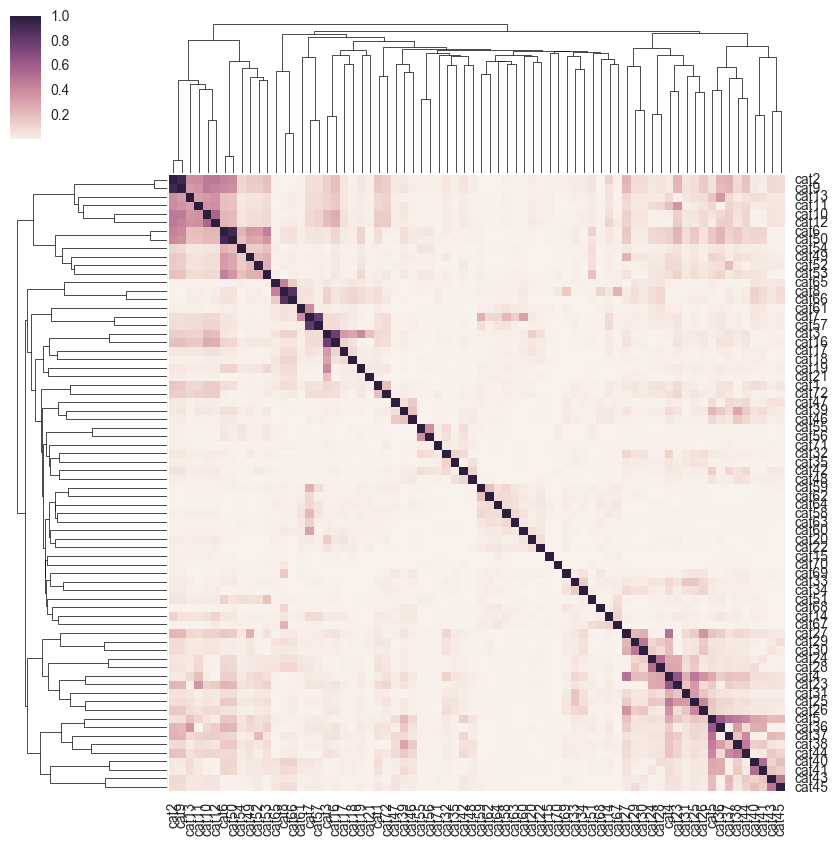

In [65]:
DATA_BINARY = DATA.iloc[:,1:73].corr().abs()
map = sns.clustermap(DATA_BINARY, annot = False, annot_kws = {'size': 12})
sns.plt.setp(map.ax_heatmap.yaxis.get_majorticklabels(),rotation = 0)
sns.plt.show()

## Dimensionality Reduction with Principal Component Analysis (PCA) on the Binary Variables Dataset Only

In [6]:
DATA_matrix = DATA.iloc[:,1:73].as_matrix()
PCA = decomposition.PCA(n_components=72)
FACTOR_matrix = PCA.fit_transform(DATA_matrix)
FACTOR_DF_PCA_BI = pd.DataFrame(FACTOR_matrix)
FACTOR_DF_PCA_BI.head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71
0,-0.979499,0.851626,0.305380,-0.307528,0.362907,0.356716,-0.201121,0.702136,0.034665,0.223504,0.204045,0.517726,-0.031967,0.279803,-0.043864,-0.041139,0.050293,0.125313,-0.394557,0.045439,0.020953,-0.011947,0.009788,0.058566,-0.003224,0.006222,0.039268,-0.087383,-0.002426,-0.000291,-0.009211,0.001846,-0.013960,0.021058,0.012192,0.007686,0.011367,0.006918,0.001281,-0.006892,0.000567,-0.001832,-0.003362,-0.003703,0.006956,0.000105,-0.003379,0.002822,0.004254,-0.000461,0.000191,-0.000311,-0.000399,0.000794,-0.000703,0.001092,-0.000120,-0.000828,0.001304,-0.000521,-0.000355,0.000929,0.000188,0.000798,-0.000084,0.000086,0.000036,0.000103,-0.000001,0.000266,0.000154,-0.000008
1,-0.844770,0.044137,-0.454588,-0.653908,-0.315236,0.249066,0.080086,0.042832,-0.298282,-0.086572,0.007366,-0.168765,-0.104949,-0.263313,0.031925,-0.623744,-0.226616,0.078632,0.031768,0.025371,-0.024310,-0.021470,-0.014162,0.000986,-0.006644,-0.012619,0.018456,0.022099,0.001467,0.002177,-0.005539,0.014183,0.011518,-0.031272,-0.003622,0.028544,0.009086,0.004877,-0.003044,0.012533,0.000893,0.002458,-0.000948,-0.000863,-0.001458,-0.000546,-0.003040,0.001101,0.000360,-0.000522,0.000355,-0.000168,0.000526,0.000447,0.000023,-0.000068,-0.000013,-0.000462,-0.000683,0.000499,-0.000382,0.000724,0.001528,-0.000044,-0.000356,-0.000093,0.000065,-0.000091,-0.000283,-0.000299,0.000865,-0.000042
2,-1.551293,-0.797824,-0.454230,0.005932,0.804263,0.407441,0.618489,-0.596696,-0.063038,0.274575,-0.254544,0.385108,0.349857,0.051986,0.041152,-0.082788,-0.169357,0.076725,-0.175556,-0.214719,0.129098,0.186330,-0.083219,-0.027999,0.041831,0.097532,-0.009222,0.026650,0.004384,0.041555,0.014466,-0.007804,-0.023620,0.114586,-0.003095,0.057641,0.019794,-0.016277,0.002093,-0.017518,0.001734,-0.010626,-0.007697,-0.000506,-0.007838,-0.007595,0.001573,0.004384,0.003033,0.002703,0.000282,0.000209,-0.001940,-0.002700,-0.000249,0.002050,0.000042,-0.000135,0.001656,-0.000919,-0.000033,0.000182,-0.000548,0.000047,-0.000036,-0.000615,0.000309,0.000276,0.000271,-0.000002,0.001317,-0.000087
3,-0.698719,0.716106,0.443984,-0.743397,0.548328,-0.446129,-0.476630,0.497470,0.112431,-0.008177,0.122347,0.019704,-0.253885,-0.045153,0.031104,0.082203,-0.090761,0.028558,0.116440,0.331448,-0.075959,-0.137203,0.044562,0.123418,-0.052495,0.007461,0.051869,-0.087152,-0.000445,-0.020872,-0.017964,0.012788,-0.003333,-0.000945,0.011134,0.015351,0.007136,0.006857,-0.003151,0.005692,0.001273,0.000786,-0.001463,-0.007167,0.007660,0.000908,-0.002419,0.002500,0.004766,-0.000007,0.000027,-0.000281,0.000568,-0.000250,0.000034,0.000620,0.000285,-0.000565,0.000845,0.000461,-0.000317,0.000689,0.001131,0.000379,-0.000239,-0.000020,-0.000087,-0.000078,0.000077,0.000315,0.000127,0.000002
4,-1.384423,0.886297,-0.110746,0.490440,0.120834,-0.149530,0.406543,0.241529,-0.044120,0.028694,0.110440,-0.162797,-0.367837,-0.713094,0.058254,0.113275,-0.232997,0.031550,0.115263,0.344483,-0.084640,-0.125956,-0.043660,0.146342,-0.048574,0.004725,0.021375,-0.097211,0.006476,-0.022743,-0.010633,0.000986,-0.021757,0.040855,0.013294,0.037075,0.000354,-0.027079,0.001129,0.019995,-0.000828,-0.000152,0.000586,-0.004096,0.006445,-0.009743,0.003468,0.002622,0.001869,-0.001527,-0.000514,-0.000111,0.000881,-0.002507,-0.001046,0.000384,-0.000766,-0.000381,0.002257,-0.000704,-0.000021,0.000877,0.002008,0.000175,0.000158,-0.000228,-0.000313,-0.000312,0.000055,0.000214,0.000484,-0.000098
5,-0.726403,0.103668,-0.426822,0.044508,-0.773978,-0.284742,-0.487230,0.199511,-0.207700,-0.048958,-0.023672,0.027969,-0.028926,0.039910,-0.020360,0.040741,0.002701,0.030517,-0.002539,-0.005586,-0.025356,-0.012892,-0.013742,-0.012982,0.000388,-0.011054,-0.000050,0.011224,0.009729,0.001313,-0.002722,0.002417,0.001505,0.003674,0.001420,-0.007831,0.003580,0.005435,0.000165,0.0

In [7]:
len(PCA.explained_variance_ratio_)

72

In [8]:
PCA.explained_variance_ratio_

array([  2.05642465e-01,   1.24502381e-01,   9.42562193e-02,
         6.84668144e-02,   4.79640587e-02,   4.25092775e-02,
         3.53625737e-02,   3.26951327e-02,   2.63835621e-02,
         2.48393804e-02,   2.02907095e-02,   1.87438177e-02,
         1.75477381e-02,   1.70890758e-02,   1.67440907e-02,
         1.43666025e-02,   1.36222034e-02,   1.26490036e-02,
         1.24717670e-02,   1.08502874e-02,   1.05636279e-02,
         9.66481362e-03,   9.15885634e-03,   8.89988471e-03,
         7.76038070e-03,   7.63277849e-03,   6.80457318e-03,
         6.32110091e-03,   6.14418365e-03,   5.77980903e-03,
         5.72589099e-03,   5.63142498e-03,   4.99556280e-03,
         4.26584766e-03,   4.06649030e-03,   3.71723829e-03,
         3.55346238e-03,   3.41860237e-03,   2.84371659e-03,
         2.73894446e-03,   2.35409461e-03,   2.28329610e-03,
         1.91385947e-03,   1.60592075e-03,   1.57560733e-03,
         1.55219029e-03,   1.37726923e-03,   1.34751010e-03,
         1.28396529e-03,

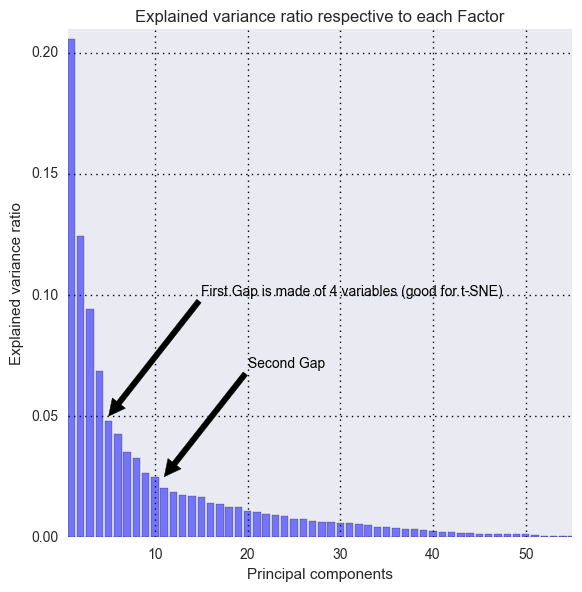

In [71]:
plt.figure(figsize = (6, 6))
plt.bar(range(1, 73), PCA.explained_variance_ratio_, alpha=0.5, align='center', color='b')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.title('Explained variance ratio respective to each Factor')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

plt.annotate('First Gap is made of 4 variables (good for t-SNE)', 
xy=(5, 0.05), xytext=(15, 0.10), arrowprops=dict(facecolor='black'), color='black')

plt.annotate('Second Gap', 
xy=(11, 0.025), xytext=(20, 0.07), arrowprops=dict(facecolor='black'), color='black')

plt.xlim([0.6,55])
plt.ylim([0.00,0.21])
plt.show()

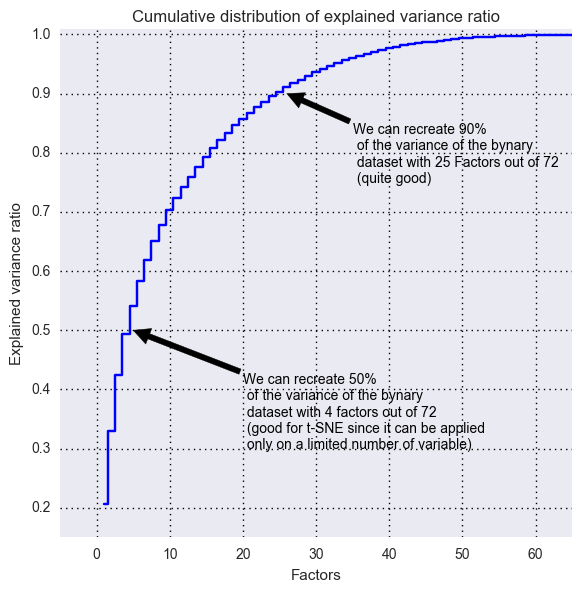

In [153]:
plt.figure(figsize = (6, 6))
plt.step(range(1, 73), np.cumsum(PCA.explained_variance_ratio_), where='mid', color='b')
plt.ylabel('Explained variance ratio')
plt.xlabel('Factors')
plt.title('Cumulative distribution of explained variance ratio')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

plt.annotate('We can recreate 90%\n of the variance of the bynary\n dataset with 25 Factors out of 72\n (quite good)', 
xy=(26, 0.90), xytext=(35, 0.75), arrowprops=dict(facecolor='black'), color='black')

plt.annotate('We can recreate 50%\n of the variance of the bynary\n dataset with 4 factors out of 72\n (good for t-SNE since it can be applied\n only on a limited number of variable)', 
xy=(5, 0.5), xytext=(20, 0.30), arrowprops=dict(facecolor='black'), color='black')

plt.xlim([-5,65])
plt.ylim([0.15,1.01])
plt.show()

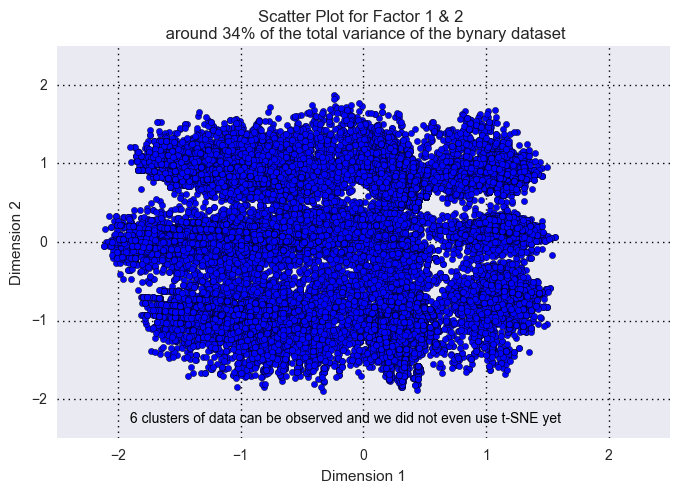

In [46]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_BI[0],FACTOR_DF_PCA_BI[1])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('Scatter Plot for Factor 1 & 2 \n around 34% of the total variance of the bynary dataset')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

plt.annotate('6 clusters of data can be observed and we did not even use t-SNE yet', 
xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

plt.ylim([-2.5,2.5])
plt.xlim([-2.5,2.5])
plt.show();

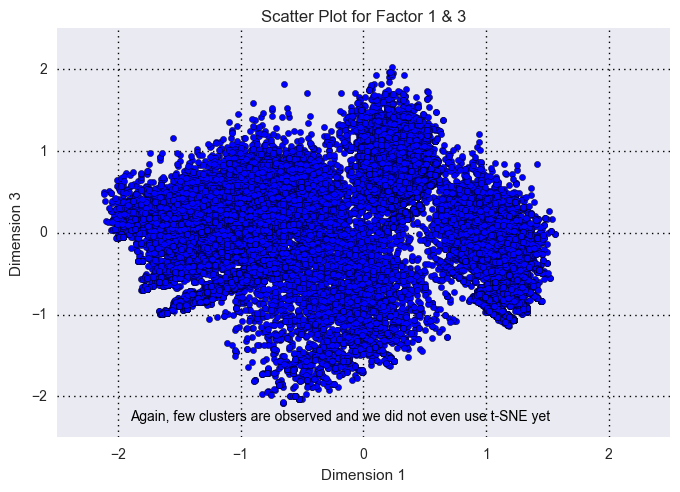

In [122]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_BI[0],FACTOR_DF_PCA_BI[2])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 3')
plt.title('Scatter Plot for Factor 1 & 3')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

plt.annotate('Again, few clusters are observed and we did not even use t-SNE yet', 
xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

plt.ylim([-2.5,2.5])
plt.xlim([-2.5,2.5])
plt.show();

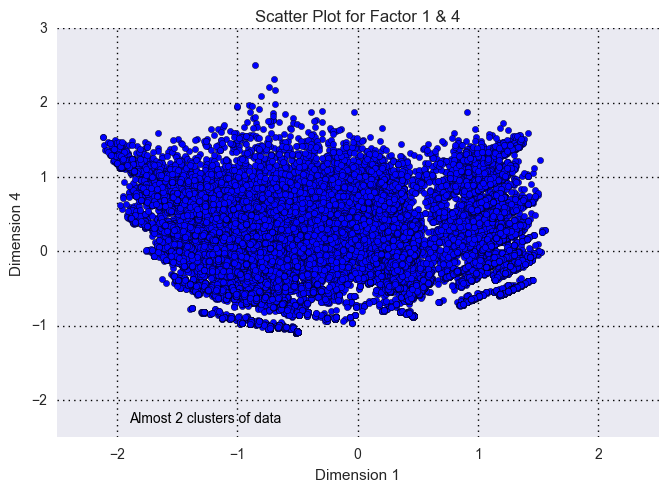

In [135]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_BI[0],FACTOR_DF_PCA_BI[3])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 4')
plt.title('Scatter Plot for Factor 1 & 4')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

plt.annotate('Almost 2 clusters of data', 
xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

plt.ylim([-2.5,3])
plt.xlim([-2.5,2.5])
plt.show();

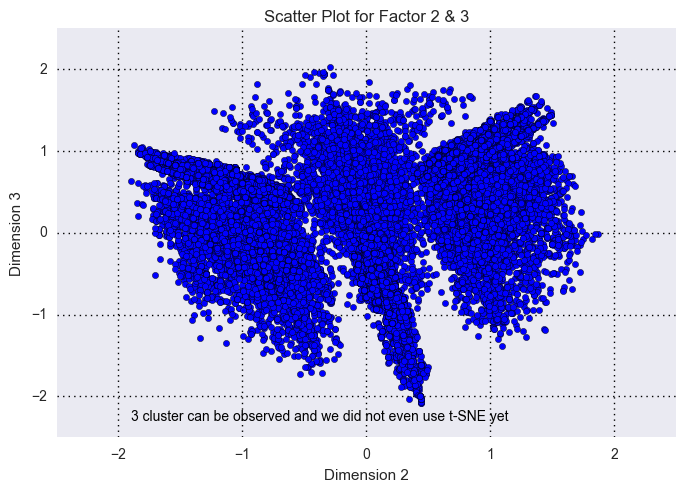

In [126]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_BI[1],FACTOR_DF_PCA_BI[2])
plt.xlabel('Dimension 2')
plt.ylabel('Dimension 3')
plt.title('Scatter Plot for Factor 2 & 3')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

plt.annotate('3 cluster can be observed and we did not even use t-SNE yet', 
xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

plt.ylim([-2.5,2.5])
plt.xlim([-2.5,2.5])
plt.show();

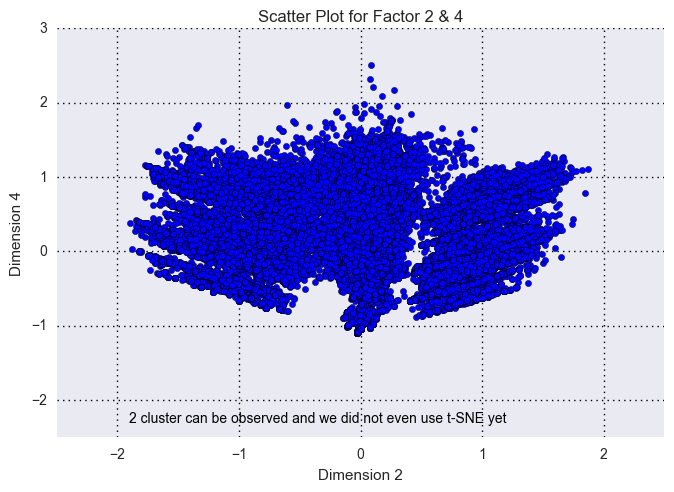

In [134]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_BI[1],FACTOR_DF_PCA_BI[3])
plt.xlabel('Dimension 2')
plt.ylabel('Dimension 4')
plt.title('Scatter Plot for Factor 2 & 4')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

plt.annotate('2 cluster can be observed and we did not even use t-SNE yet', 
xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

plt.ylim([-2.5,3])
plt.xlim([-2.5,2.5])
plt.show();

## Dimensionality Reduction with T-distributed stochastic neighbor embedding (t-SNE) on top of Principal component analysis (PCA)

In [139]:
PROJECTION = pd.DataFrame(FACTOR_DF_PCA_BI.iloc[:,0:4])
PROJECTION.columns = ['FACTOR_t-SNE_1', 'FACTOR_t-SNE_2','FACTOR_t-SNE_3','FACTOR_t-SNE_4']
PROJECTION.head(20)

,FACTOR_t-SNE_1,FACTOR_t-SNE_2,FACTOR_t-SNE_3,FACTOR_t-SNE_4
0,-0.979499,0.851626,0.305380,-0.307528
1,-0.844770,0.044137,-0.454588,-0.653908
2,-1.551293,-0.797824,-0.454230,0.005932
3,-0.698719,0.716106,0.443984,-0.743397
4,-1.384423,0.886297,-0.110746,0.490440
5,-0.726403,0.103668,-0.426822,0.044508
6,0.178734,-0.988520,0.544150,0.007458
7,-0.836907,0.823766,0.426134,-0.327095
8,-1.959603,-0.191171,0.083879,1.231716
9,-0.012375,-1.056791,-0.683087,0.256055


In [155]:
PROJECTION2 = PROJECTION.sample(n=10000, replace=False, random_state=42, axis=0)

start_time = time.clock()

tsne = TSNE(n_components=2, random_state=0)
X_tsne = tsne.fit_transform(PROJECTION2)

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")


Total Estimation Running Time:
208.43122995394975 Seconds


In [158]:
X_tsne = pd.DataFrame(X_tsne)
X_tsne.columns = ["TSNE_1", "TSNE_2"]
X_tsne.head(20)

,TSNE_1,TSNE_2
0,1.405812,-3.717692
1,-2.602690,2.037915
2,4.038311,2.354857
3,6.910525,-2.185751
4,-2.834610,-10.254735
5,1.532716,-6.432909
6,1.159606,-9.359087
7,-2.041771,8.578282
8,1.051920,-0.653085
9,-2.929505,-7.802189


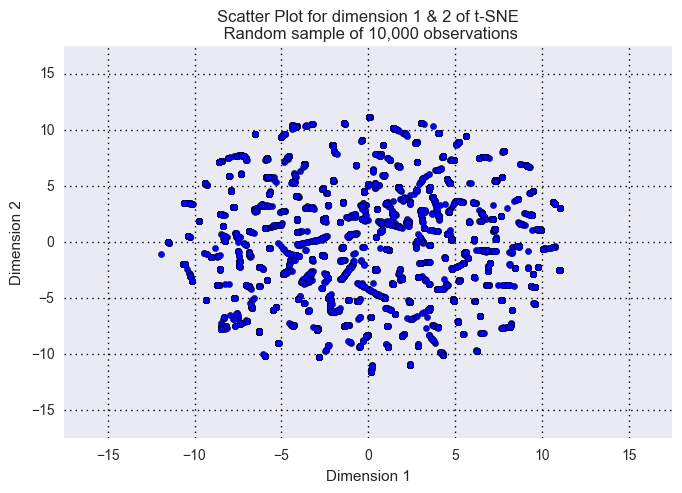

In [166]:
plt.figure(figsize = (7, 5))
plt.scatter(X_tsne['TSNE_1'],X_tsne['TSNE_2'])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('Scatter Plot for dimension 1 & 2 of t-SNE\n Random sample of 10,000 observations')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

#plt.annotate('2 cluster can be observed and we did not even use t-SNE yet', 
#xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

plt.ylim([-17.5,17.5])
plt.xlim([-17.5,17.5])
plt.show();

## Dimensionality Reduction with Principal Component Analysis (PCA) on the Continuous Variables Dataset Only

Continuous data are provided as normalized by the compagny

In [11]:
DATA.iloc[:,-17:-3].head(1)

,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14
0,0.7263,0.245921,0.187583,0.789639,0.310061,0.718367,0.33506,0.3026,0.67135,0.8351,0.569745,0.594646,0.822493,0.714843


In [7]:
DATA_matrix = DATA.iloc[:,-17:-3].as_matrix()
PCA = decomposition.PCA(n_components=14)
FACTOR_matrix = PCA.fit_transform(DATA_matrix)
FACTOR_DF_PCA_CO = pd.DataFrame(FACTOR_matrix)
FACTOR_DF_PCA_CO.head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,-0.545334,-0.419501,-0.310094,-0.135573,-0.081052,0.009124,0.217686,0.207622,-0.282958,0.051550,0.009912,-0.000076,-0.000448,-0.015023
1,0.210998,-0.087978,0.486013,0.143161,-0.103702,0.150328,-0.176813,0.104680,0.028328,0.071846,-0.025834,-0.008739,0.025449,-0.021873
2,0.574641,0.074912,-0.300072,-0.271779,-0.031514,-0.045133,0.003979,0.026514,-0.010778,-0.135470,0.098206,-0.008945,-0.077723,0.004731
3,0.301759,0.010672,-0.095364,-0.092717,-0.001303,0.256120,0.016528,0.134099,-0.071893,0.055105,-0.010876,0.018298,0.003225,0.001551
4,0.802018,-0.219993,-0.117696,0.053261,-0.191531,-0.183006,-0.148191,0.029488,-0.105183,0.029199,-0.030572,0.015656,-0.007772,0.001140
5,0.262799,0.138163,-0.079332,-0.229776,0.030036,0.093953,0.333626,-0.068496,-0.029499,0.058497,0.031025,0.034667,0.023958,0.003187
6,0.373079,0.239251,-0.090451,0.114341,0.006600,0.214662,0.298719,-0.082720,0.006338,-0.022895,0.066953,0.041283,-0.023616,-0.014170
7,-0.916636,-0.233762,0.087225,0.284657,0.056484,0.101244,-0.082462,-0.151919,0.041049,-0.029173,0.033944,-0.004767,-0.020563,-0.092152
8,-0.211152,0.078463,-0.035987,0.143948,0.233734,0.182981,-0.146763,0.180133,-0.158279,-0.202306,0.021275,0.020535,-0.057639,0.006824
9,-0.747145,-0.054702,-0.149996,0.249924,-0.042052,-0.151738,0.169152,0.246805,-0.347144,-0.062360,-0.044076,-0.010524,0.060985,-0.015561


In [6]:
len(PCA.explained_variance_ratio_)

14

In [7]:
PCA.explained_variance_ratio_

array([  4.21709919e-01,   1.42491564e-01,   1.11767139e-01,
         8.60040790e-02,   6.44212164e-02,   5.74030886e-02,
         3.95440234e-02,   2.66823220e-02,   1.97697474e-02,
         1.60443151e-02,   8.70776677e-03,   2.64953293e-03,
         2.40341107e-03,   4.01874976e-04])

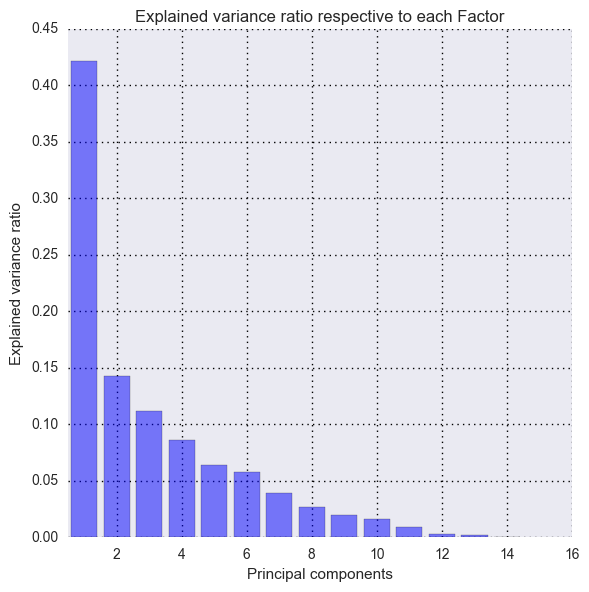

In [18]:
plt.figure(figsize = (6, 6))
plt.bar(range(1, 15), PCA.explained_variance_ratio_, alpha=0.5, align='center', color='b')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.title('Explained variance ratio respective to each Factor')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

#plt.annotate('First Gap is made of 4 variables (good for t-SNE)', 
#xy=(5, 0.05), xytext=(15, 0.10), arrowprops=dict(facecolor='black'), color='black')

#plt.annotate('Second Gap', 
#xy=(11, 0.025), xytext=(20, 0.07), arrowprops=dict(facecolor='black'), color='black')

plt.xlim([0.5,16])
#plt.ylim([0.00,0.21])
plt.show()

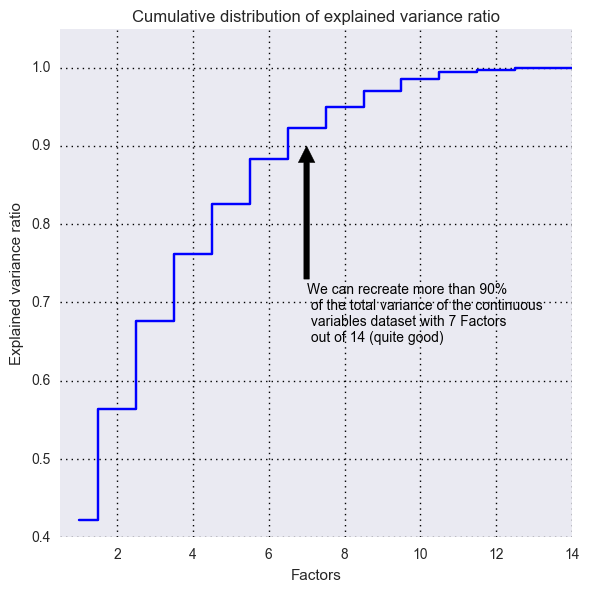

In [34]:
plt.figure(figsize = (6, 6))
plt.step(range(1, 15), np.cumsum(PCA.explained_variance_ratio_), where='mid', color='b')
plt.ylabel('Explained variance ratio')
plt.xlabel('Factors')
plt.title('Cumulative distribution of explained variance ratio')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

plt.annotate('We can recreate more than 90%\n of the total variance of the continuous\n variables dataset with 7 Factors\n out of 14 (quite good)', 
xy=(7, 0.90), xytext=(7, 0.65), arrowprops=dict(facecolor='black'), color='black')

#plt.annotate('We can recreate 50%\n of the variance of the bynary\n dataset with 4 factors out of 72\n (good for t-SNE since it can be applied\n only on a limited number of variable)', 
#xy=(5, 0.5), xytext=(20, 0.30), arrowprops=dict(facecolor='black'), color='black')

plt.xlim([0.5,14])
plt.ylim([0.4,1.05])
plt.show()

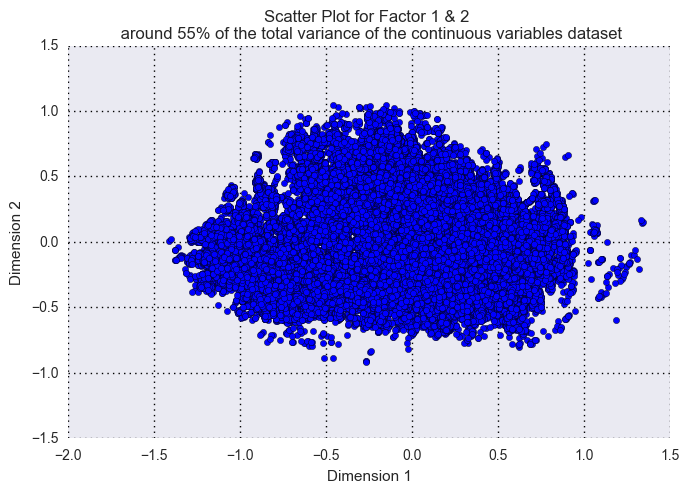

In [35]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_CO[0],FACTOR_DF_PCA_CO[1])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('Scatter Plot for Factor 1 & 2 \n around 55% of the total variance of the continuous variables dataset')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

#plt.annotate('6 clusters of data can be observed and we did not even use t-SNE yet', 
#xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

#plt.ylim([-2.5,2.5])
#plt.xlim([-2.5,2.5])
plt.show();

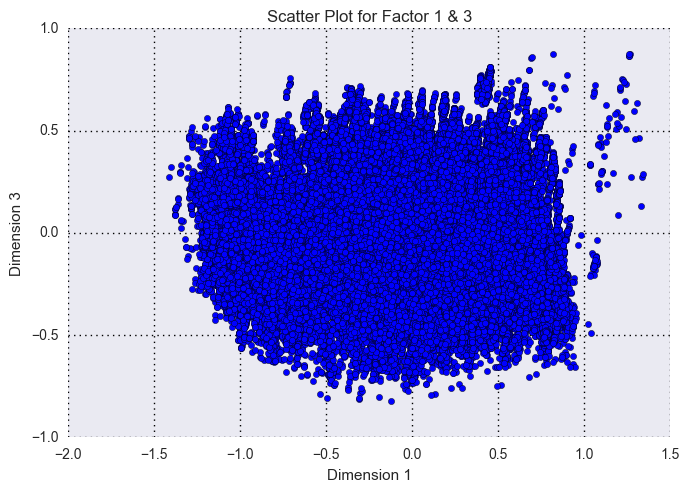

In [36]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_CO[0],FACTOR_DF_PCA_CO[2])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 3')
plt.title('Scatter Plot for Factor 1 & 3')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

#plt.annotate('Again, few clusters are observed and we did not even use t-SNE yet', 
#xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

#plt.ylim([-2.5,2.5])
#plt.xlim([-2.5,2.5])
plt.show();

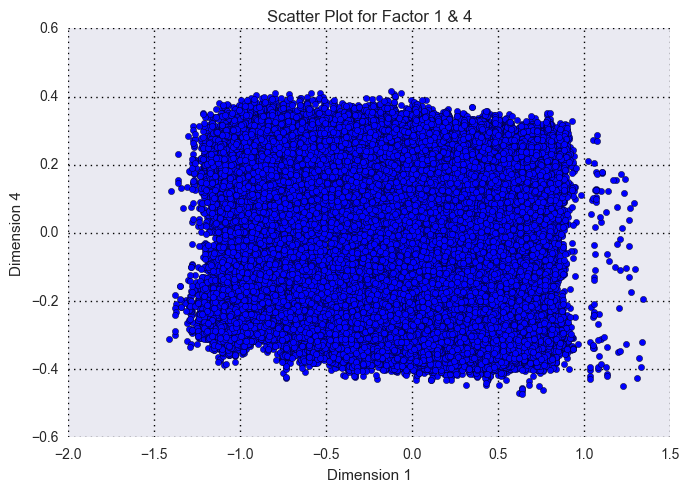

In [37]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_CO[0],FACTOR_DF_PCA_CO[3])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 4')
plt.title('Scatter Plot for Factor 1 & 4')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

#plt.annotate('Almost 2 clusters of data', 
#xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

#plt.ylim([-2.5,3])
#plt.xlim([-2.5,2.5])
plt.show();

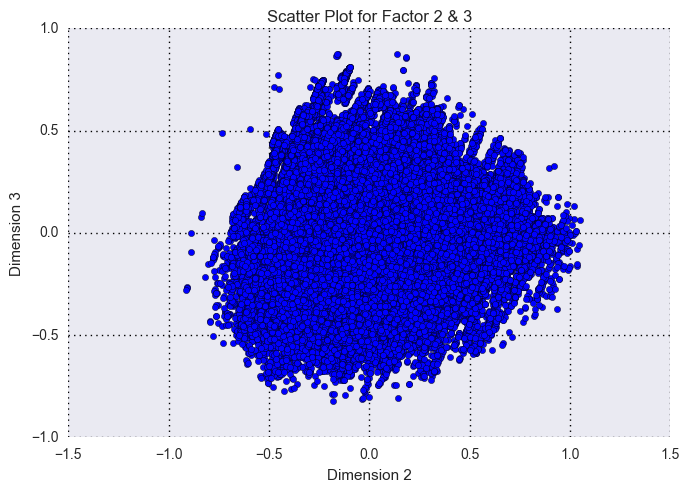

In [38]:
plt.figure(figsize = (7, 5))
plt.scatter(FACTOR_DF_PCA_CO[1],FACTOR_DF_PCA_CO[2])
plt.xlabel('Dimension 2')
plt.ylabel('Dimension 3')
plt.title('Scatter Plot for Factor 2 & 3')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

#plt.annotate('3 cluster can be observed and we did not even use t-SNE yet', 
#xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

#plt.ylim([-2.5,2.5])
#plt.xlim([-2.5,2.5])
plt.show();

## Dimensionality Reduction with T-distributed stochastic neighbor embedding (t-SNE) on top of Principal component analysis (PCA)

In [10]:
PROJECTION = pd.DataFrame(FACTOR_DF_PCA_CO.iloc[:,0:4])
PROJECTION.columns = ['FACTOR_t-SNE_1', 'FACTOR_t-SNE_2','FACTOR_t-SNE_3','FACTOR_t-SNE_4']
PROJECTION.head(20)

,FACTOR_t-SNE_1,FACTOR_t-SNE_2,FACTOR_t-SNE_3,FACTOR_t-SNE_4
0,-0.545334,-0.419501,-0.310094,-0.135573
1,0.210998,-0.087978,0.486013,0.143161
2,0.574641,0.074912,-0.300072,-0.271779
3,0.301759,0.010672,-0.095364,-0.092717
4,0.802018,-0.219993,-0.117696,0.053261
5,0.262799,0.138163,-0.079332,-0.229776
6,0.373079,0.239251,-0.090451,0.114341
7,-0.916636,-0.233762,0.087225,0.284657
8,-0.211152,0.078463,-0.035987,0.143948
9,-0.747145,-0.054702,-0.149996,0.249924


In [11]:
PROJECTION2 = PROJECTION.sample(n=10000, replace=False, random_state=42, axis=0)

start_time = time.clock()

tsne = TSNE(n_components=2, random_state=0)
X_tsne = tsne.fit_transform(PROJECTION2)

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")


Total Estimation Running Time:
204.89651023263616 Seconds


In [12]:
X_tsne = pd.DataFrame(X_tsne)
X_tsne.columns = ["TSNE_1", "TSNE_2"]
X_tsne.head(20)

,TSNE_1,TSNE_2
0,2.615786,3.146440
1,2.938274,-3.967463
2,-1.499446,-5.096076
3,1.775669,-3.711275
4,-1.557028,-5.940388
5,-1.741999,-4.696897
6,6.941618,-0.197982
7,8.138792,-2.067744
8,7.265903,3.055765
9,-2.205117,-3.885147


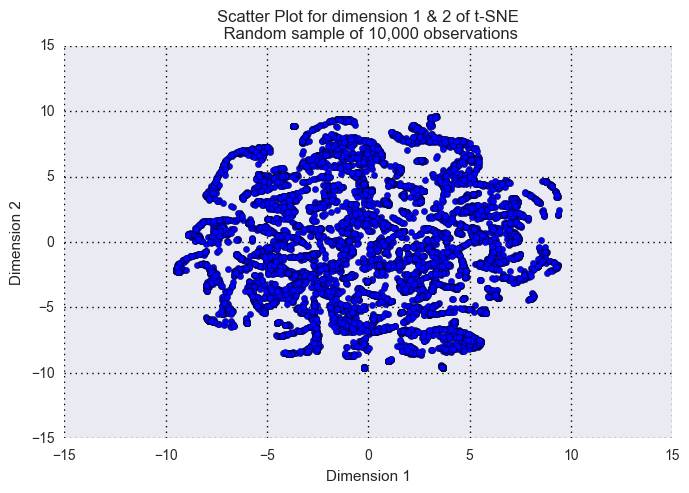

In [13]:
plt.figure(figsize = (7, 5))
plt.scatter(X_tsne['TSNE_1'],X_tsne['TSNE_2'])
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.title('Scatter Plot for dimension 1 & 2 of t-SNE\n Random sample of 10,000 observations')
plt.tight_layout()
plt.grid(color='black', linestyle='dotted')

#plt.annotate('2 cluster can be observed and we did not even use t-SNE yet', 
#xy=(-1.9, -2.3), xytext=(-1.9, -2.3), color='black')

#plt.ylim([-17.5,17.5])
#plt.xlim([-17.5,17.5])
plt.show();

## New Distribution and Correlation Patterns for Continuous Variables

PCA creates factors that are normaly distributed and nornalized. By definition, the last factors will gets obviously less variance

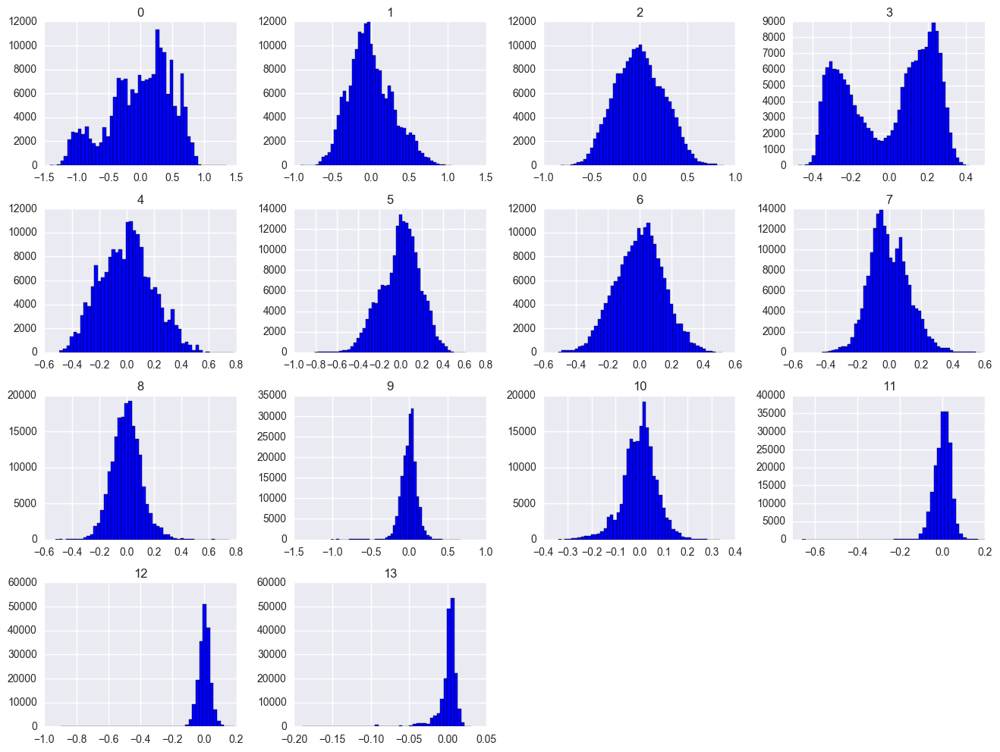

In [16]:
FACTOR_DF_PCA_CO.hist(bins=50, figsize=(16,12), color='b');

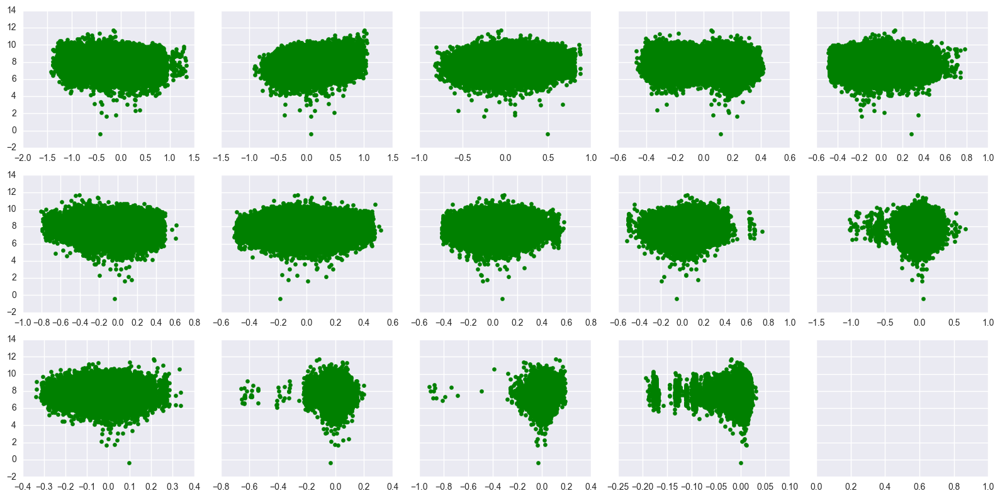

In [14]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(16, 8), sharey=True)

Ai = 0
Bi = 0

for i in range(0, 14):
    axes[Ai][Bi].scatter(FACTOR_DF_PCA_CO[i], DATA.log_loss, color='g')
    Bi += 1
    if Bi > 4:
        Ai += 1
        Bi = 0
plt.tight_layout();

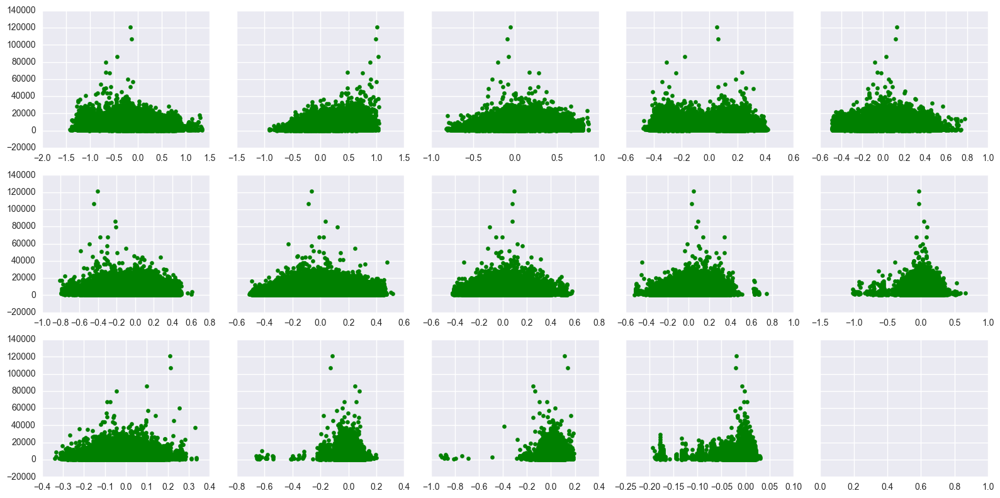

In [15]:
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(16, 8), sharey=True)

Ai = 0
Bi = 0

for i in range(0, 14):
    axes[Ai][Bi].scatter(FACTOR_DF_PCA_CO[i], DATA.loss, color='g')
    Bi += 1
    if Bi > 4:
        Ai += 1
        Bi = 0
plt.tight_layout();

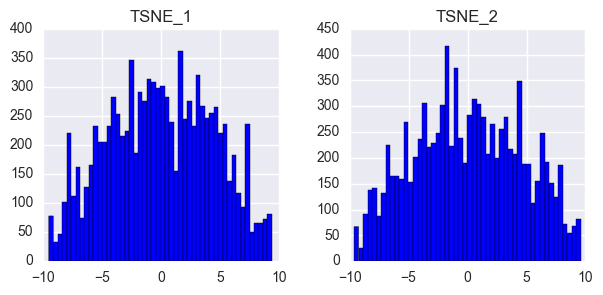

In [23]:
X_tsne.hist(bins=50, figsize=(7,3), color='b');

# Part 4) Modelling the Claim Severity

In [54]:
seed = 1

trainx = DATA.columns[1:73]
trainy = DATA.columns[-2]

X = DATA[trainx]
Y = DATA[trainy]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.1, random_state=0)

In [ ]:
start_time = time.clock()

print("")
print("")
print("") 
print("List of Average ROC AUC According to the Algorithm (Training Dataset with K-Fold Cross-validation)")
print("") 

N_ES = 10
K = 10

start_time = time.clock()

model1 = LinearRegression(n_jobs=-1)
results1 = cross_val_score(model1, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results1.mean(), results1.std()))

model2 = Ridge(alpha=1,random_state=seed)
results2 = cross_val_score(model2, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression Ridge (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results2.mean(), results2.std()))

model3 = Lasso(alpha=1,random_state=seed)
results3 = cross_val_score(model3, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression Lasso (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results3.mean(), results3.std()))

model4 = ElasticNet(alpha=1,random_state=seed)
results4 = cross_val_score(model4, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression Elastic Net (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results4.mean(), results4.std()))

model5 = KNeighborsRegressor(n_neighbors=n_neighbors,n_jobs=-1)
results5 = cross_val_score(model5, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("K Neighbors Regressor (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results5.mean(), results5.std()))

model6 = SVR(C=C)
results6 = cross_val_score(model6, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("SVR (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results6.mean(), results6.std()))

model7 = DecisionTreeRegressor(max_depth=max_depth,random_state=seed)
results7 = cross_val_score(model7, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Decision Tree Regressor (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results7.mean(), results7.std()))

model8 = BaggingRegressor(n_jobs=-1,n_estimators=n_estimators)
results8 = cross_val_score(model8, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Bagging Regressor (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results8.mean(), results8.std()))

model9 = RandomForestRegressor(n_jobs=-1,n_estimators=N_ES, max_features=5, random_state=seed)
results9 = cross_val_score(model9, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Random Forest Regressor (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results9.mean(), results9.std()))

model10 = ExtraTreesRegressor(n_jobs=-1,n_estimators=n_estimators,random_state=seed)
results10 = cross_val_score(model10, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Extra Trees Regressor (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results10.mean(), results10.std()))

model11 = AdaBoostRegressor(n_estimators=n_estimators,random_state=seed)
results11 = cross_val_score(model11, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("AdaBoost Regressor (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results11.mean(), results11.std()))

model12 = GradientBoostingRegressor(n_estimators=n_estimators,random_state=seed)
results12 = cross_val_score(model12, X_train, y_train, cv=K, scoring='mean_absolute_error', n_jobs=1)
print("Gradient Boosting Regressor (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results12.mean(), results12.std()))

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

## 4.1) Modelling on Raw data

## Simple Linear Benchmark on Raw Data

#### ...Just to know how much we would perform

In [6]:
model1 = LinearRegression(n_jobs=-1)
results1 = cross_val_score(model1, X_train, y_train, cv=5, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(-1*results1.mean(), results1.std()))

Linear Regression (Manual Tuning): (0.505) +/- (0.001)


In [7]:
X2 = sm.add_constant(X)
model = sm.OLS(Y, X2)
model_ = model.fit()
print(model_.summary())

                            OLS Regression Results                            
Dep. Variable:               log_loss   R-squared:                       0.374
Model:                            OLS   Adj. R-squared:                  0.373
Method:                 Least Squares   F-statistic:                     1559.
Date:                Sun, 04 Jun 2017   Prob (F-statistic):               0.00
Time:                        18:51:07   Log-Likelihood:            -1.8392e+05
No. Observations:              188318   AIC:                         3.680e+05
Df Residuals:                  188245   BIC:                         3.687e+05
Df Model:                          72                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [95.0% Conf. Int.]
------------------------------------------------------------------------------
const          7.1623      0.004   1678.033      0.0

Ridge Regression with regularization parameter Alpha = 1

In [23]:
model2 = Ridge(alpha=1,random_state=seed)
results2 = cross_val_score(model2, X_train, y_train, cv=5, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression Ridge (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results2.mean(), results2.std()))

Linear Regression Ridge (Manual Tuning): (-0.505) +/- (0.001)


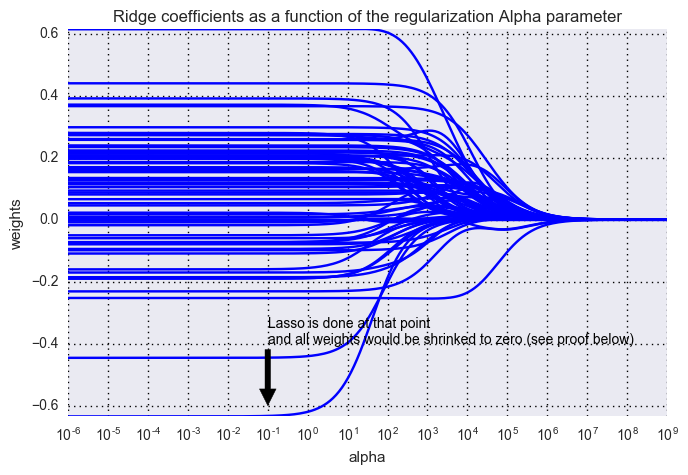


Total Estimation Running Time:
33.431114639635325 Seconds


In [42]:
start_time = time.clock()

clf = Ridge()
coefs = []
alphas = np.logspace(-6, 9, 200)

for a in alphas:
    clf.set_params(alpha=a)
    clf.fit(X2, Y)
    coefs.append(clf.coef_)

plt.figure(figsize=(17, 5))
plt.subplot(121)
ax = plt.gca()
ax.plot(alphas, coefs, color='b')
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Ridge coefficients as a function of the regularization Alpha parameter')
plt.axis('tight')

plt.annotate('Lasso is done at that point \nand all weights would be shrinked to zero (see proof below)', 
xy=(0.1, -0.6), xytext=(0.1, -0.4), arrowprops=dict(facecolor='black'), color='black')
plt.grid(color='black', linestyle='dotted')
plt.show()

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

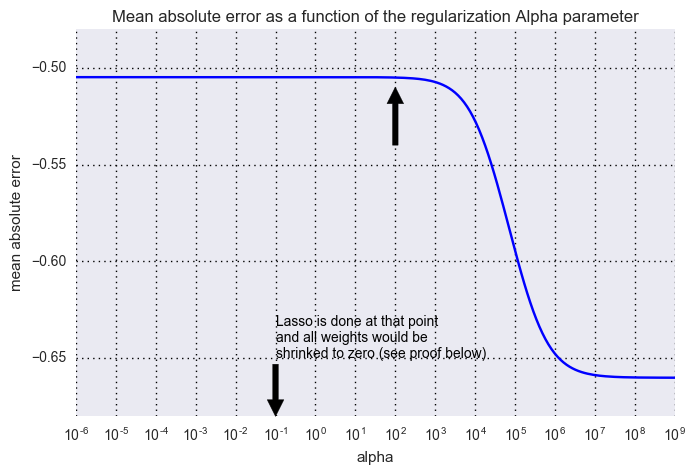


Total Estimation Running Time:
290.7568824080772 Seconds


In [49]:
start_time = time.clock()

clf = Ridge()
error = []
alphas = np.logspace(-6, 9, 200)

for a in alphas:
    clf.set_params(alpha=a)
    #clf.fit(X2, Y)
    error.append(cross_val_score(clf, X2, Y, cv=5, scoring='mean_absolute_error', n_jobs=1).mean())

plt.figure(figsize=(17, 5))

plt.subplot(121)
ax = plt.gca()
ax.plot(alphas, error, color='b')
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('mean absolute error')
plt.title('Mean absolute error as a function of the regularization Alpha parameter')
plt.axis('tight')

plt.annotate('Lasso is done at that point \nand all weights would be \nshrinked to zero (see proof below)', 
xy=(0.1, -0.68), xytext=(0.1, -0.65), arrowprops=dict(facecolor='black'), color='black')
plt.annotate('', 
xy=(100, -0.51), xytext=(100, -0.54), arrowprops=dict(facecolor='black'), color='black')
plt.grid(color='black', linestyle='dotted')
plt.ylim([-0.68,-0.48])
#plt.xlim([-17.5,17.5])
plt.show()

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

Lasso Regression with regularization parameter Alpha (α) = 0.0001  
For regularization matter, Lasso, not only shrink the coefficient, but can put them down to zero.  
A smaller value of Alpha is required in order to get good results with a 5-folds Cross-Validation

In [60]:
model3 = Lasso(alpha=0.0001,random_state=seed)
results3 = cross_val_score(model3, X_train, y_train, cv=5, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression Lasso (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results3.mean(), results3.std()))

Linear Regression Lasso (Manual Tuning): (-0.505) +/- (0.001)


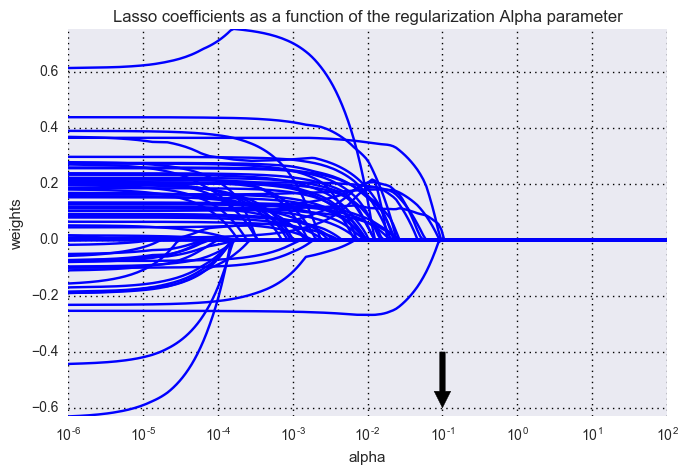


Total Estimation Running Time:
145.52669209417763 Seconds


In [43]:
start_time = time.clock()

clf = Lasso()
coefs = []
alphas = np.logspace(-6, 2, 200)

for a in alphas:
    clf.set_params(alpha=a)
    clf.fit(X2, Y)
    coefs.append(clf.coef_)

plt.figure(figsize=(17, 5))
plt.subplot(121)
ax = plt.gca()
ax.plot(alphas, coefs, color='b')
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('weights')
plt.title('Lasso coefficients as a function of the regularization Alpha parameter')
plt.axis('tight')

plt.annotate('', 
xy=(0.1, -0.6), xytext=(0.1, -0.4), arrowprops=dict(facecolor='black'), color='black')
plt.grid(color='black', linestyle='dotted')
plt.show()

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

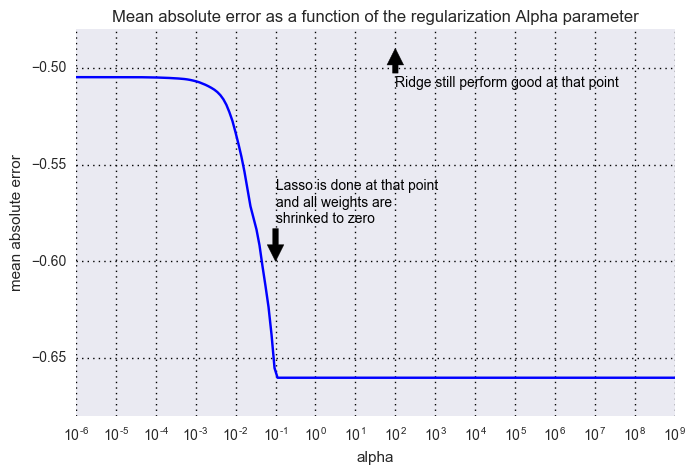


Total Estimation Running Time:
586.1534860694569 Seconds


In [58]:
start_time = time.clock()

clf = Lasso()
error = []
alphas = np.logspace(-6, 9, 200)

for a in alphas:
    clf.set_params(alpha=a)
    #clf.fit(X2, Y)
    error.append(cross_val_score(clf, X2, Y, cv=5, scoring='mean_absolute_error', n_jobs=1).mean())

plt.figure(figsize=(17, 5))

plt.subplot(121)
ax = plt.gca()
ax.plot(alphas, error, color='b')
ax.set_xscale('log')
plt.xlabel('alpha')
plt.ylabel('mean absolute error')
plt.title('Mean absolute error as a function of the regularization Alpha parameter')
plt.axis('tight')

plt.annotate('Lasso is done at that point \nand all weights are \nshrinked to zero', 
xy=(0.1, -0.60), xytext=(0.1, -0.58), arrowprops=dict(facecolor='black'), color='black')
plt.annotate('Ridge still perform good at that point', 
xy=(100, -0.49), xytext=(100, -0.51), arrowprops=dict(facecolor='black'), color='black')
plt.grid(color='black', linestyle='dotted')
plt.ylim([-0.68,-0.48])
#plt.xlim([-17.5,17.5])
plt.show()

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

Elastic Net Linear Regression. For l1_ratio = 0 the penalty is an L2 penalty (i.e. Ridge Linear Regression). For l1_ratio = 1 it is an L1 penalty (i.e. Lasso Linear Regression). For 0 < l1_ratio < 1, the penalty is a combination of L1 and L2 (i.e. Ridge & Lasso Linear Regression Combined).

In [75]:
model4 = ElasticNet(alpha=0.0001,l1_ratio=0.5,random_state=seed)
results4 = cross_val_score(model4, X_train, y_train, cv=5, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression Elastic Net (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results4.mean(), results4.std()))

Linear Regression Elastic Net (Manual Tuning): (-0.505) +/- (0.001)


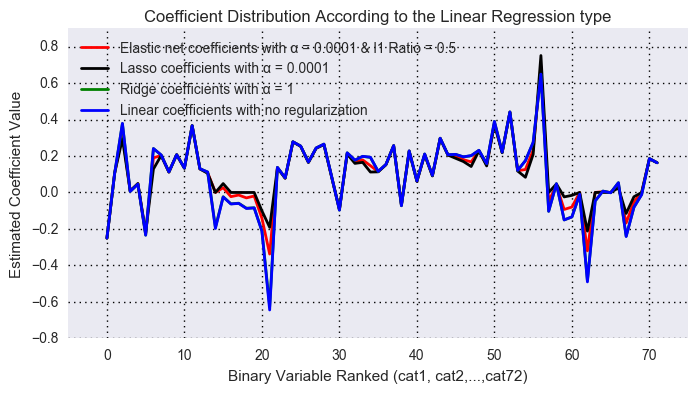

In [110]:
lasso = Lasso(alpha=0.0001)
lasso.fit(X_train, y_train)
ridge = Ridge(alpha=1,random_state=seed)
ridge.fit(X_train, y_train)
linear = LinearRegression()
linear.fit(X_train, y_train)
enet = ElasticNet(alpha=0.0001, l1_ratio=0.5)
enet.fit(X_train, y_train)

plt.figure(figsize = (8, 4))
plt.plot(enet.coef_, color='red', linewidth=2,label='Elastic net coefficients with α = 0.0001 & l1 Ratio = 0.5')
plt.plot(lasso.coef_, color='black', linewidth=2,label='Lasso coefficients with α = 0.0001')
plt.plot(ridge.coef_, color='green', linewidth=2,label='Ridge coefficients with α = 1')
plt.plot(linear.coef_, color='blue', linewidth=2,label='Linear coefficients with no regularization')
plt.grid(color='black', linestyle='dotted')
plt.ylim([-0.8,0.9])
plt.xlim([-5,75])
plt.legend(loc='best')
plt.title('Coefficient Distribution According to the Linear Regression type')
plt.xlabel('Binary Variable Ranked (cat1, cat2,...,cat72)')
plt.ylabel('Estimated Coefficient Value')
plt.show()

### Random Forest on raw binary data

In [26]:
start_time = time.clock()

model9 = RandomForestRegressor(n_jobs=-1,n_estimators=300, max_features=5, random_state=seed)
results9 = cross_val_score(model9, X_train, y_train, cv=5, scoring='mean_absolute_error', n_jobs=1)
print("Random Forest Regressor (Manual Tuning): ({0:.10f}) +/- ({1:.3f})".format(-1*results9.mean(), results9.std()))

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

Random Forest Regressor (Manual Tuning): (0.4987076217) +/- (0.002)

Total Estimation Running Time:
76.48502740224285 Seconds


Forest made of 300 trees in 76 secondes. Perform slightly better than linear regression, but not as good as Neural Network below

Did we miss a more optimal number of tree???

In [30]:
start_time = time.clock()

h = [50, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]
scores = []

for val in h:
    model = RandomForestRegressor(n_jobs=-1,n_estimators=val, max_features=5, random_state=seed)
    results = cross_val_score(model, X_train, y_train, cv=5, scoring='mean_absolute_error', n_jobs=1)
    scores.append(-1*results.mean())
        
end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")


Total Estimation Running Time:
1427.0855698625146 Seconds


It took 1,427 secondes to run 11 different setting on 200,000 cases. Let's take a look at the results

In [49]:
scores

[0.49924101137330634,
 0.49893438758781372,
 0.49875193969028209,
 0.49870762168295835,
 0.49869339474675689,
 0.49866119192855329,
 0.49863413302547188,
 0.49862285022204278,
 0.49861763925024266,
 0.49860961857903063,
 0.49861171874825105]

The improvement is not that large. Let's play with a simple Random Forest Model made of 100 trees

In [59]:
model = RandomForestRegressor(n_jobs=-1,n_estimators=100, max_features=5, random_state=seed)
model.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features=5, max_leaf_nodes=None, min_samples_leaf=1,
           min_samples_split=2, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=-1, oob_score=False, random_state=1,
           verbose=0, warm_start=False)

#### Noticing the level of randomness in a forest made of 100 trees

Let's define few fonction first (Thanks to Data Scientist Aysen Tatarinov, who make me learn we can visualize a forest made of many trees on a unique and simple elegant graph).

In [89]:
def leaf__depths(estimator, nodeid = 0):
     left__child = estimator.children_left[nodeid]
     right__child = estimator.children_right[nodeid]
     
     if left__child == _tree.TREE_LEAF:
         depths = np.array([0])
     else:
         left__depths = leaf__depths(estimator, left__child) + 1
         right__depths = leaf__depths(estimator, right__child) + 1
         depths = np.append(left__depths, right__depths)
 
     return depths

In [90]:
def leaf__samples(estimator, nodeid = 0):  
     left__child = estimator.children_left[nodeid]
     right__child = estimator.children_right[nodeid]

     if left__child == _tree.TREE_LEAF: 
         samples = np.array([estimator.n_node_samples[nodeid]])
     else:
         left__samples = leaf__samples(estimator, left__child)
         right__samples = leaf__samples(estimator, right__child)
         samples = np.append(left__samples, right__samples)

     return samples

In [91]:
def visualization__estimator(ensemble, tree_id=0):

     plt.figure(figsize=(8,8))
     plt.subplot(211)

     estimator = ensemble.estimators_[tree_id].tree_
     depths = leaf__depths(estimator)
     
     plt.hist(depths, histtype='step', color='blue', bins=range(min(depths), max(depths)+1))
     plt.grid(color='black', linestyle='dotted')
     plt.xlabel("Depth of leaf nodes (tree %s)" % tree_id)
     plt.show()

In [92]:
def visualization__forest(ensemble):

     plt.figure(figsize=(8,8))
     plt.subplot(211)

     depths__all = np.array([], dtype=int)

     for x in ensemble.estimators_:
         estimator = x.tree_
         depths = leaf__depths(estimator)
         depths__all = np.append(depths__all, depths)
         plt.hist(depths, histtype='step', color='blue', 
                  bins=range(min(depths), max(depths)+1))

     plt.hist(depths__all, histtype='step', color='blue', 
              bins=range(min(depths__all), max(depths__all)+1), 
              weights=np.ones(len(depths__all))/len(ensemble.estimators_), 
              linewidth=2)
     plt.grid(color='black', linestyle='dotted')
     plt.xlabel("Depth of leaf nodes")
    
     plt.show()

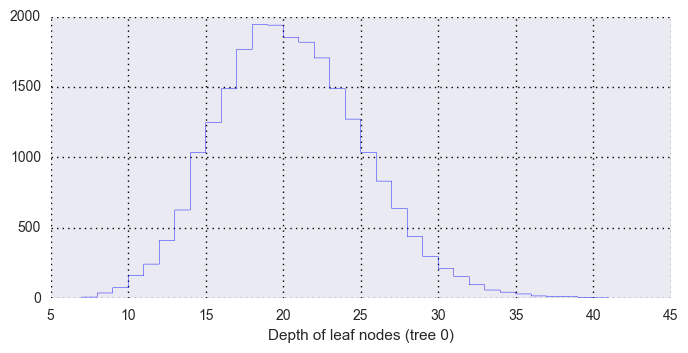


Total Estimation Running Time:
0.3507070505820593 Seconds


In [93]:
start_time = time.clock()

visualization__estimator(model)

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

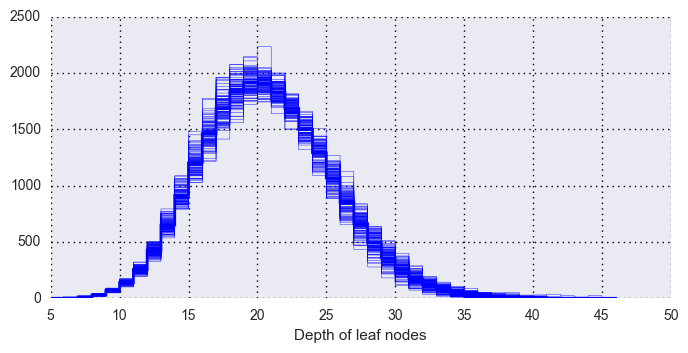


Total Estimation Running Time:
24.14988959173843 Seconds


In [94]:
start_time = time.clock()

visualization__forest(model)

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

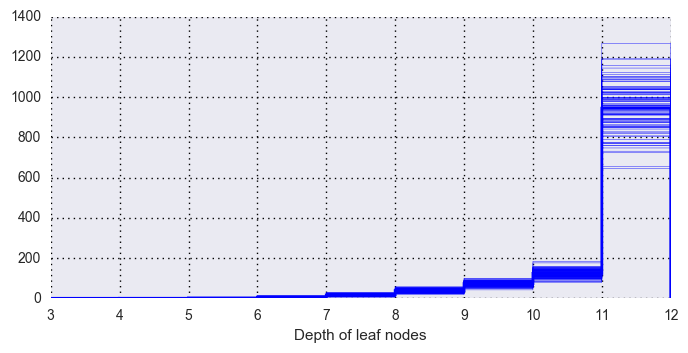


Total Estimation Running Time:
4.613667380584502 Seconds


In [77]:
start_time = time.clock()

model = RandomForestRegressor(n_jobs=-1,n_estimators=100, max_features=5, max_depth=12, random_state=seed)
model.fit(X_train, y_train)
visualization__forest(model)

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

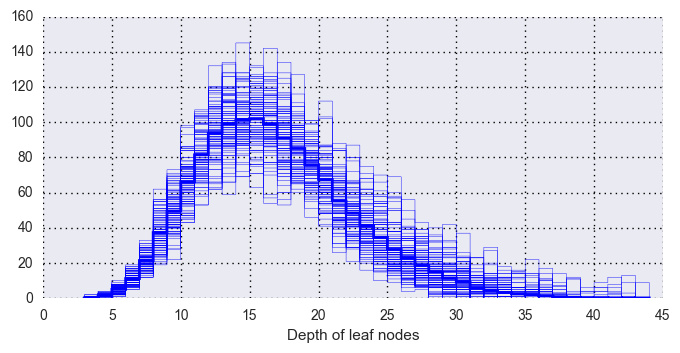


Total Estimation Running Time:
6.33855293483748 Seconds


In [78]:
start_time = time.clock()

model = RandomForestRegressor(n_jobs=-1,n_estimators=100, max_features=5, min_samples_leaf=3, random_state=seed)
model.fit(X_train, y_train)
visualization__forest(model)

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

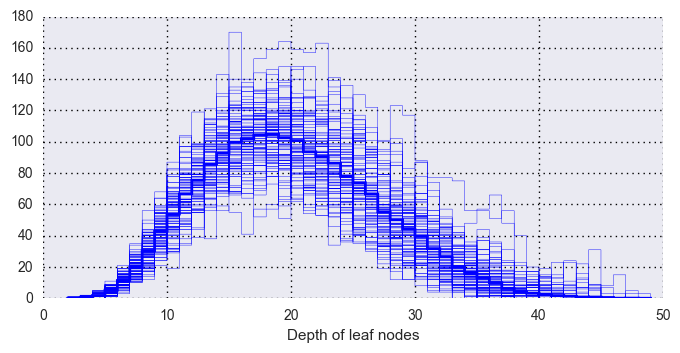


Total Estimation Running Time:
6.209226296938596 Seconds


In [79]:
start_time = time.clock()

model = RandomForestRegressor(n_jobs=-1,n_estimators=100, max_features=3, min_samples_leaf=2, random_state=seed)
model.fit(X_train, y_train)
visualization__forest(model)

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

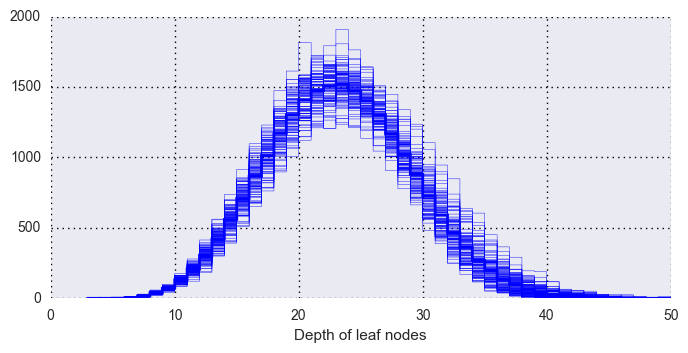


Total Estimation Running Time:
32.88775547475552 Seconds


In [80]:
start_time = time.clock()

model = RandomForestRegressor(n_jobs=-1,n_estimators=100, max_features=5, bootstrap=False, random_state=seed)
model.fit(X_train, y_train)
visualization__forest(model)

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

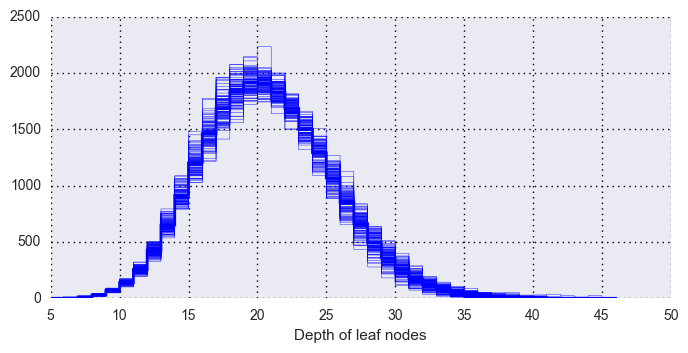


Total Estimation Running Time:
44.05137704685421 Seconds


In [81]:
start_time = time.clock()

model = RandomForestRegressor(n_jobs=-1,n_estimators=100, max_features=30, bootstrap=False, random_state=seed)
model.fit(X_train, y_train)
visualization__forest(model)

end_time = time.clock()
print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

### Single Decision Tree

In [9]:
model7 = DecisionTreeRegressor(random_state=seed)
results7 = cross_val_score(model7, X_train, y_train, cv=5, scoring='mean_absolute_error', n_jobs=1)
print("Decision Tree Regressor (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(results7.mean(), results7.std()))

Decision Tree Regressor (Manual Tuning): (-0.519) +/- (0.002)


In [21]:
SINGLE_DECISION_TREE_grid = GridSearchCV(
    estimator = DecisionTreeRegressor(splitter='best', random_state=seed),
    param_grid = 
{     
'max_depth':[10,20,30],
'min_samples_split':[10,50,100,500],
'min_samples_leaf':[10,50,100,500],
'max_features':[3,5,10,20],
'max_leaf_nodes':[10,20,30,40,50]
}, 
cv = 5, 
scoring = 'mean_absolute_error', 
n_jobs = -1)

SINGLE_DECISION_TREE_grid.fit(X_train, y_train)
print("SINGLE_DECISION_TREE (With Grid Search): ({0:.3f})".format(SINGLE_DECISION_TREE_grid.best_score_))

SINGLE_DECISION_TREE (With Grid Search): (-0.532)


## Neural Network with Keras (Tensorflow backend) - No Learning Rate Control


Total Estimation Running Time:
123.16045171816819 Seconds


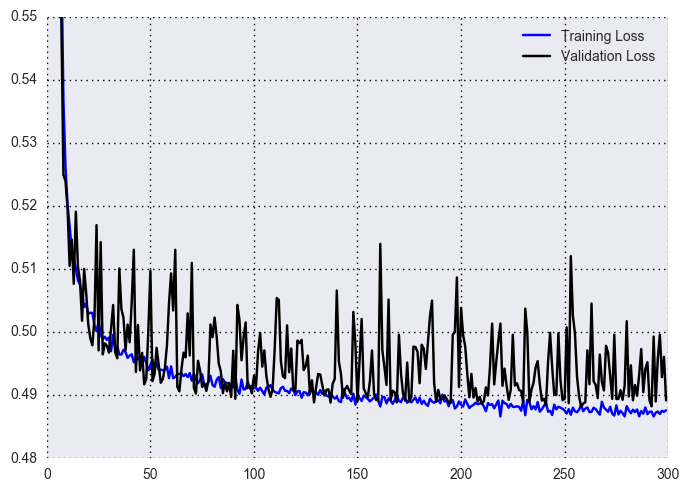

In [48]:
start_time = time.clock()

model = Sequential()
model.add(Dense(35, input_dim=X.shape[1]))
model.add(Activation('relu'))
model.add(Dense(17))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))
model.compile(loss='mean_absolute_error', optimizer="rmsprop")
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=400, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    plt.ylim([0.48,0.55])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

## Neural Network (Modifing Optimizer and Adding Learning rate Decay Schedule)


Total Estimation Running Time:
123.805986382647 Seconds


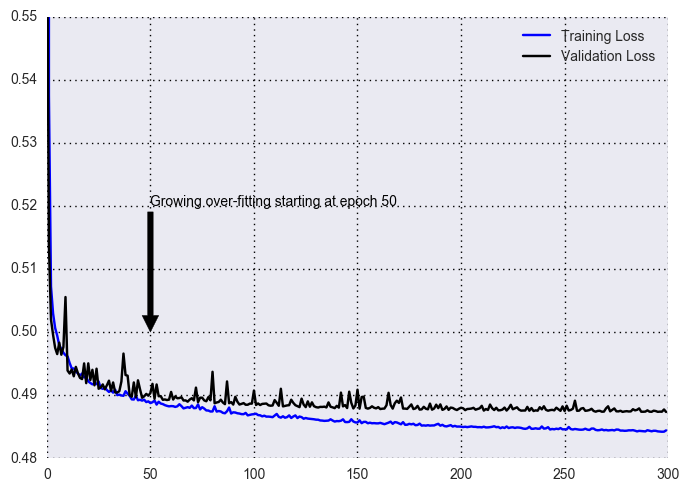

In [61]:
start_time = time.clock()

model = Sequential()
model.add(Dense(35, input_dim=X.shape[1]))
model.add(Activation('relu'))
model.add(Dense(17))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))

epochs = 300
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(loss='mean_absolute_error', optimizer=sgd)
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=epochs, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    plt.annotate('Growing over-fitting starting at epoch 50', 
    xy=(50, 0.50), xytext=(50, 0.52), arrowprops=dict(facecolor='black'), color='black')
    plt.ylim([0.48,0.55])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

## Neural Network (Adding Dropout as Regularization for Avoiding Over-fitting)


Total Estimation Running Time:
149.26183926331714 Seconds


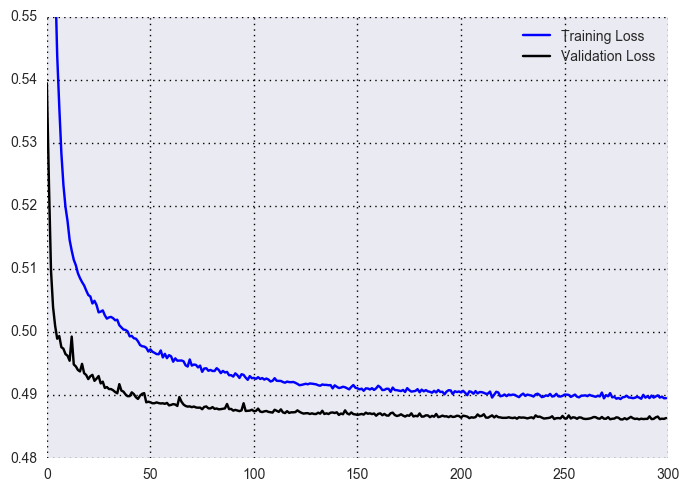

In [68]:
start_time = time.clock()

model = Sequential()
model.add(Dense(35, input_dim=X.shape[1]))
model.add(Dropout(0.05))
model.add(Activation('relu'))
model.add(Dense(17))
model.add(Dropout(0.05))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))

epochs = 300
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(loss='mean_absolute_error', optimizer=sgd)
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=epochs, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    #plt.annotate('Linear Model Benchmark is 0.5', 
    #xy=(50, 0.50), xytext=(100, 0.5005), arrowprops=dict(facecolor='black'), color='black')
    plt.ylim([0.48,0.55])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

Dropout parameter is too high (i.e. 0.05). The training set is not able to learn enough and the test set perform better

## Neural Network (Dropout Adjustment for Allowing Training Set to Learn Enough)


Total Estimation Running Time:
146.21314220941622 Seconds


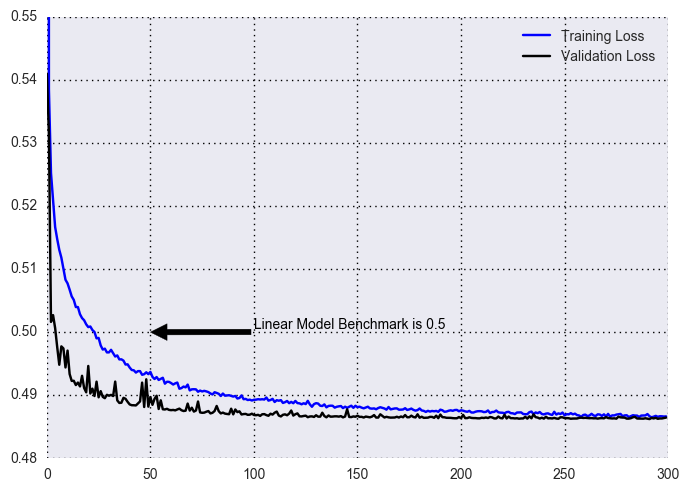

In [6]:
start_time = time.clock()

model = Sequential()
model.add(Dense(35, input_dim=X.shape[1]))
model.add(Dropout(0.01))
model.add(Activation('relu'))
model.add(Dense(17))
model.add(Dropout(0.01))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))

epochs = 300
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(loss='mean_absolute_error', optimizer=sgd)
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=epochs, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    plt.annotate('Linear Model Benchmark is 0.5', 
    xy=(50, 0.50), xytext=(100, 0.5005), arrowprops=dict(facecolor='black'), color='black')
    plt.ylim([0.48,0.55])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

In [14]:
models_history['mlp_v1']['val_loss'][-1]

0.48645261837171111

### Neural Network with Tensorflow

### 4.2) Modelling on Preprocessed Data (PCA)

Building a preprocessed dataset made of the first half of the continuous and binary factors (i.e. all factors are normally distributed, uncorrelated and capture a significant amount of variance from the binary and continuous dataset)

In [13]:
trainy = DATA.columns[-2]
Y = DATA[trainy]

In [14]:
PROCESSED_DATA_PCA = np.concatenate((FACTOR_DF_PCA_CO.iloc[:,0:7], FACTOR_DF_PCA_BI.iloc[:,0:25]), axis=1)
PROCESSED_DATA_PCA = pd.DataFrame(PROCESSED_DATA_PCA)
Y = pd.DataFrame(Y)
PROCESSED_DATA_PCA = np.concatenate((PROCESSED_DATA_PCA, Y), axis=1)
PROCESSED_DATA_PCA = pd.DataFrame(PROCESSED_DATA_PCA)
PROCESSED_DATA_PCA.head(20)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32
0,-0.545334,-0.419501,-0.310094,-0.135573,-0.081052,0.009124,0.217686,-0.979499,0.851626,0.305380,-0.307528,0.362907,0.356716,-0.201121,0.702136,0.034665,0.223504,0.204045,0.517726,-0.031967,0.279803,-0.043864,-0.041139,0.050293,0.125313,-0.394557,0.045439,0.020953,-0.011947,0.009788,0.058566,-0.003224,7.702186
1,0.210998,-0.087978,0.486013,0.143161,-0.103702,0.150328,-0.176813,-0.844770,0.044137,-0.454588,-0.653908,-0.315236,0.249066,0.080086,0.042832,-0.298282,-0.086572,0.007366,-0.168765,-0.104949,-0.263313,0.031925,-0.623744,-0.226616,0.078632,0.031768,0.025371,-0.024310,-0.021470,-0.014162,0.000986,-0.006644,7.157424
2,0.574641,0.074912,-0.300072,-0.271779,-0.031514,-0.045133,0.003979,-1.551293,-0.797824,-0.454230,0.005932,0.804263,0.407441,0.618489,-0.596696,-0.063038,0.274575,-0.254544,0.385108,0.349857,0.051986,0.041152,-0.082788,-0.169357,0.076725,-0.175556,-0.214719,0.129098,0.186330,-0.083219,-0.027999,0.041831,8.008063
3,0.301759,0.010672,-0.095364,-0.092717,-0.001303,0.256120,0.016528,-0.698719,0.716106,0.443984,-0.743397,0.548328,-0.446129,-0.476630,0.497470,0.112431,-0.008177,0.122347,0.019704,-0.253885,-0.045153,0.031104,0.082203,-0.090761,0.028558,0.116440,0.331448,-0.075959,-0.137203,0.044562,0.123418,-0.052495,6.845720
4,0.802018,-0.219993,-0.117696,0.053261,-0.191531,-0.183006,-0.148191,-1.384423,0.886297,-0.110746,0.490440,0.120834,-0.149530,0.406543,0.241529,-0.044120,0.028694,0.110440,-0.162797,-0.367837,-0.713094,0.058254,0.113275,-0.232997,0.031550,0.115263,0.344483,-0.084640,-0.125956,-0.043660,0.146342,-0.048574,7.924380
5,0.262799,0.138163,-0.079332,-0.229776,0.030036,0.093953,0.333626,-0.726403,0.103668,-0.426822,0.044508,-0.773978,-0.284742,-0.487230,0.199511,-0.207700,-0.048958,-0.023672,0.027969,-0.028926,0.039910,-0.020360,0.040741,0.002701,0.030517,-0.002539,-0.005586,-0.025356,-0.012892,-0.013742,-0.012982,0.000388,8.545367
6,0.373079,0.239251,-0.090451,0.114341,0.006600,0.214662,0.298719,0.178734,-0.988520,0.544150,0.007458,-0.038634,0.456768,-0.234993,-0.506012,0.273056,0.351346,-0.294406,0.161527,-0.279688,-0.199012,-0.023482,-0.126098,0.221617,0.137295,-0.219241,0.008001,0.039092,0.168375,-0.058849,0.026963,0.047614,7.031936
7,-0.916636,-0.233762,0.087225,0.284657,0.056484,0.101244,-0.082462,-0.836907,0.823766,0.426134,-0.327095,0.211966,0.400813,-0.508878,0.644230,0.064805,0.061113,0.118790,0.086959,-0.253654,-0.125617,-0.018967,0.012424,0.015894,-0.055439,0.526950,-0.141915,0.051031,-0.030857,-0.006717,0.131189,-0.089648,8.184723
8,-0.211152,0.078463,-0.035987,0.143948,0.233734,0.182981,-0.146763,-1.959603,-0.191171,0.083879,1.231716,1.125541,0.055902,0.774558,-0.328223,0.409455,0.192206,0.631644,-0.200110,-0.459630,0.821156,-0.206566,-0.012130,-0.061914,0.048277,-0.038055,-0.020410,-0.115488,-0.391489,-0.166126,0.088440,-0.103747,9.237975
9,-0.747145,-0.054702,-0.149996,0.249924,-0.042052,-0.151738,0.169152,-0.012375,-1.056791,-0.683087,0.256055,0.889137,0.606494,-0.958260,0.050512,-0.055473,0.181560,0.604281,-0.480977,0.225759,-0.169849,-0.037817,-0.167174,0.470133,0.082162,-0.210900,-0.312388,-0.596801,-0.472715,0.055918,0.420713,0.489418,8.729816


In [15]:
trainx = PROCESSED_DATA_PCA.columns[0:-1]
trainy = PROCESSED_DATA_PCA.columns[-1]
X = PROCESSED_DATA_PCA[trainx]
Y = PROCESSED_DATA_PCA[trainy]

### Linear Model on Preprocessed Data (PCA)

A simple linear model give us 0.5. Same as previous results above.

In [16]:
model1 = LinearRegression(n_jobs=-1)
results1 = cross_val_score(model1, X, Y, cv=5, scoring='mean_absolute_error', n_jobs=1)
print("Linear Regression (Manual Tuning): ({0:.3f}) +/- ({1:.3f})".format(-1*results1.mean(), results1.std()))

Linear Regression (Manual Tuning): (0.500) +/- (0.002)


### Neural Network on Preprocessed Data (PCA)

The same Neural Network setting perform better on preprocessed data.


Total Estimation Running Time:
94.75618988107908 Seconds


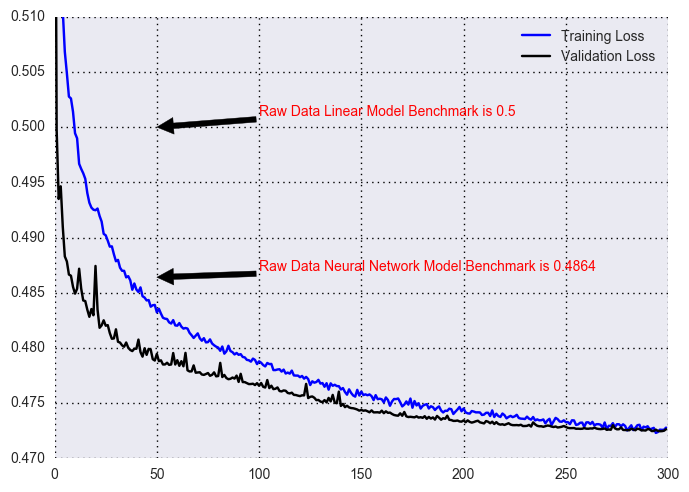

In [29]:
start_time = time.clock()

model = Sequential()
model.add(Dense(35, input_dim=X.shape[1]))
model.add(Dropout(0.01))
model.add(Activation('relu'))
model.add(Dense(17))
model.add(Dropout(0.01))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))

epochs = 300
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(loss='mean_absolute_error', optimizer=sgd)
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=epochs, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    plt.annotate('Raw Data Linear Model Benchmark is 0.5', 
    xy=(50, 0.50), xytext=(100, 0.50099999), arrowprops=dict(facecolor='black'), color='red')
    plt.annotate('Raw Data Neural Network Model Benchmark is 0.4864', 
    xy=(50, 0.4864), xytext=(100, 0.48699999), arrowprops=dict(facecolor='black'), color='red')
    plt.ylim([0.47,.51])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

In [30]:
models_history['mlp_v1']['val_loss'][-1]

0.47263038264130169

There is still space for improvement. Let's increase the number of neurons in the first and second hidden layers.


Total Estimation Running Time:
427.5665774646395 Seconds


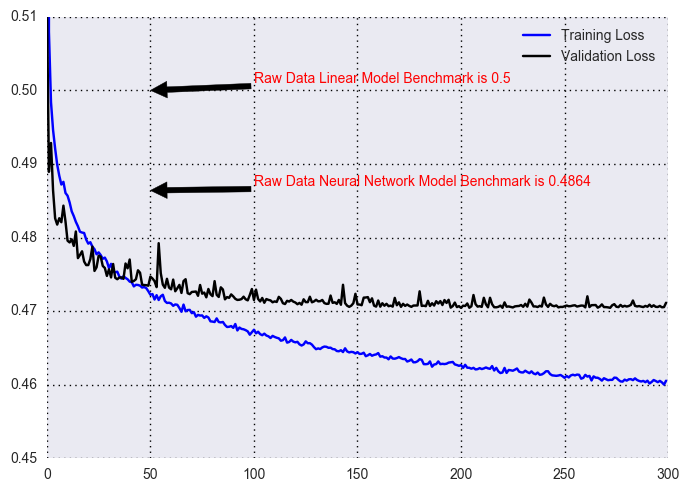

In [32]:
start_time = time.clock()

model = Sequential()
model.add(Dense(200, input_dim=X.shape[1]))
model.add(Dropout(0.01))
model.add(Activation('relu'))
model.add(Dense(100))
model.add(Dropout(0.01))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))

epochs = 300
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(loss='mean_absolute_error', optimizer=sgd)
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=epochs, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    plt.annotate('Raw Data Linear Model Benchmark is 0.5', 
    xy=(50, 0.50), xytext=(100, 0.50099999), arrowprops=dict(facecolor='black'), color='red')
    plt.annotate('Raw Data Neural Network Model Benchmark is 0.4864', 
    xy=(50, 0.4864), xytext=(100, 0.48699999), arrowprops=dict(facecolor='black'), color='red')
    plt.ylim([0.45,.51])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

In [33]:
models_history['mlp_v1']['val_loss'][-1]

0.47113404652782692

A more flexible model will stabilize the results at 0.4711 in the validation set, but we need to fix for overfitting. A higher probability of dropout may be the key.

Dropout 0.015


Total Estimation Running Time:
427.50300373863683 Seconds


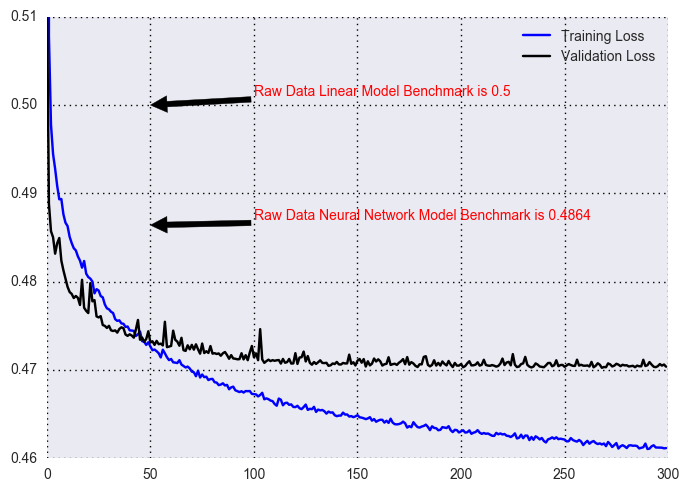

In [34]:
start_time = time.clock()

model = Sequential()
model.add(Dense(200, input_dim=X.shape[1]))
model.add(Dropout(0.015))
model.add(Activation('relu'))
model.add(Dense(100))
model.add(Dropout(0.015))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))

epochs = 300
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(loss='mean_absolute_error', optimizer=sgd)
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=epochs, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    plt.annotate('Raw Data Linear Model Benchmark is 0.5', 
    xy=(50, 0.50), xytext=(100, 0.50099999), arrowprops=dict(facecolor='black'), color='red')
    plt.annotate('Raw Data Neural Network Model Benchmark is 0.4864', 
    xy=(50, 0.4864), xytext=(100, 0.48699999), arrowprops=dict(facecolor='black'), color='red')
    plt.ylim([0.46,.51])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

In [35]:
models_history['mlp_v1']['val_loss'][-1]

0.47037252286858949

Dropout 0.02


Total Estimation Running Time:
426.9483225943759 Seconds


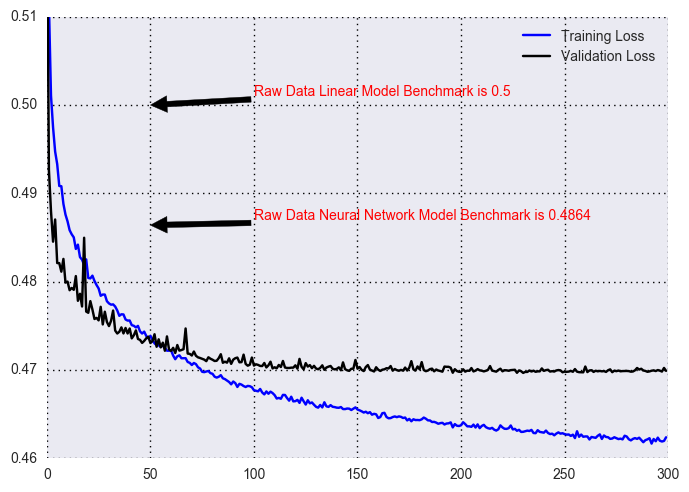

In [36]:
start_time = time.clock()

model = Sequential()
model.add(Dense(200, input_dim=X.shape[1]))
model.add(Dropout(0.02))
model.add(Activation('relu'))
model.add(Dense(100))
model.add(Dropout(0.02))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))

epochs = 300
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(loss='mean_absolute_error', optimizer=sgd)
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=epochs, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    plt.annotate('Raw Data Linear Model Benchmark is 0.5', 
    xy=(50, 0.50), xytext=(100, 0.50099999), arrowprops=dict(facecolor='black'), color='red')
    plt.annotate('Raw Data Neural Network Model Benchmark is 0.4864', 
    xy=(50, 0.4864), xytext=(100, 0.48699999), arrowprops=dict(facecolor='black'), color='red')
    plt.ylim([0.46,.51])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

In [37]:
models_history['mlp_v1']['val_loss'][-1]

0.46990219833441682

Dropout 0.04

In [ ]:
start_time = time.clock()

model = Sequential()
model.add(Dense(200, input_dim=X.shape[1]))
model.add(Dropout(0.04))
model.add(Activation('relu'))
model.add(Dense(100))
model.add(Dropout(0.04))
model.add(Activation('relu'))
model.add(Dense(1))
model.add(Activation('relu'))

epochs = 300
learning_rate = 0.1
decay_rate = learning_rate / epochs
momentum = 0.8

sgd = SGD(lr=learning_rate, momentum=momentum, decay=decay_rate, nesterov=False)
model.compile(loss='mean_absolute_error', optimizer=sgd)
fit = model.fit(X.values, Y, validation_split=0.2, batch_size=5000, nb_epoch=epochs, verbose=0)

hist = fit.history
models_history = {}
models_history['mlp_v1'] = hist

def plot_mlp_loss(history, title):
    plt.figure(figsize = (7, 5))
    #fig.set_size_inches(16,5)

    #plt.set_title('{} 50 epochs'.format(title))
    #plt.set_xlabel('Epochs')
    #plt.set_ylabel('Loss')
    #plt.set_xlim([0,500])
    plt.annotate('Raw Data Linear Model Benchmark is 0.5', 
    xy=(50, 0.50), xytext=(100, 0.50099999), arrowprops=dict(facecolor='black'), color='red')
    plt.annotate('Raw Data Neural Network Model Benchmark is 0.4864', 
    xy=(50, 0.4864), xytext=(100, 0.48699999), arrowprops=dict(facecolor='black'), color='red')
    plt.ylim([0.46,.51])
    plt.grid(True)
    plt.plot(history['loss'][0:500], label='Training Loss', color='blue')
    plt.plot(history['val_loss'][0:500], label='Validation Loss', color='black')
    plt.tight_layout()
    plt.grid(color='black', linestyle='dotted')
    plt.legend()

plot_mlp_loss(models_history['mlp_v1'], 'mlp_v1')  

end_time = time.clock()

print("")
print("Total Estimation Running Time:")
print(end_time - start_time, "Seconds")

# Work in Progress...
# Work in Progress...
# Work in Progress...

# Part 5) Results

# Part 6) Bibliography

 Deep Learning Tutorial
 http://deeplearning.net/tutorial/deeplearning.pdf
 
 Practical Recommendations for Gradient-Based Training of Deep Architectures
 https://arxiv.org/pdf/1206.5533v2.pdf
  
 Dropout: A Simple Way to Prevent Neural Networks from Overfitting
 https://www.cs.toronto.edu/~hinton/absps/JMLRdropout.pdf
  
 Batch Normalization: Accelerating Deep Network Training by Reducing Internal Covariate Shift 
 http://proceedings.mlr.press/v37/ioffe15.pdf
  
 Python for Data Analysis
 http://www3.canisius.edu/~yany/python/Python4DataAnalysis.pdf
  
 Python Machine Learning
 http://www.bogotobogo.com/python/scikit-learn/files/Python_Machine_Learning_Sebastian_Raschka.pdf
  
 The Self-Organizing Map
 http://concepts.psych.wisc.edu/papers/711/Kohonen90ProcIEEE.SOM.pdf
    
 Deep Forest: Towards an Alternative to Deep Neural Networks
 https://arxiv.org/pdf/1702.08835.pdf
 
 XGBoost: A Scalable Tree Boosting System
 http://www.kdd.org/kdd2016/papers/files/rfp0697-chenAemb.pdf
 
 LightGBM Documentation Release
 https://media.readthedocs.org/pdf/lightgbm/latest/lightgbm.pdf
 
 CDS Rate Construction Methods by Machine Learning Techniques 
 https://mpra.ub.uni-muenchen.de/79194/1/MPRA_paper_79194.pdf
 
 How to Get Reproducible Results with Keras
 http://machinelearningmastery.com/reproducible-results-neural-networks-keras/

# Part 7) Annexe